<h1>ZMGSN Lista 1 - Generative Adversarial Network (GAN)</h1>

<h2>Opis zadania</h2>

W ramach zadania należy:
<ol>
<li>Zapoznać się z poniższym eksperymentem z wykorzystaniem modelu DCGAN</li>
<li>Dokonać analizy wpływu hiperparametrów eksperymentu, np. kroku uczenia, rozmiaru pakietu (ang. <i>batch size</i>), liczby epok na wyniki modelu GAN</li>
<li>Dokonać modyfikacji architektury modelu DCGAN (generatora i dyskryminatora) w celu zbadania wpływu architektury na wyniki</li>
<li>Dokonać ewaluacji innych wariantów sieci GAN, np. CycleGAN, LAPGAN, SRGAN itp.</li>
<li>Opracować procedurę ewaluacji jakości działania modeli GAN, uwzględniającą różne metody wizualizacji (np. wykresy, miary, klasy), klasteryzacji, redukcji wymiarów (np. t-SNE)</li>
</ol>

Ocenie podlegać będzie jakość wykonania zadania, w tym:
<ol>
<li>Właściwe wykonanie zadań</li>
<li>Rzetelne opracowanie wyników, uwzględniające analizę jakościową i ilościową</li>
<li>Opracowanie wniosków mających na celu wyjaśnienie badanych zjawisk i uzyskanych wyników</li>
<li>Opracowanie i wyjaśnienie kodu źródłowego</li>
</ol>


<h2>Import używanych bibliotek</h2>

In [1]:
import os

import cv2
import gdown
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import shutil
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as tt

from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
from torchvision.utils import make_grid
from torchvision.utils import save_image
from tqdm.notebook import tqdm
from torch.nn import BCELoss, MSELoss
from itertools import islice

<h2>Konfiguracja stylu prezentacji wykresów generowanych za pomocą biblioteki Seaborn</h2>

In [4]:
sns.set(style='darkgrid', font_scale=1.2)

<h2>Pobranie i rozpakowanie zbioru danych</h2>

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
url = 'https://drive.google.com/uc?id=1n98A5XmCBWmZhXD2Hq-bz9Ms_yZl1oXl'
output = 'cats_faces.zip'
gdown.download(url, output, quiet=False)


Downloading...
From: https://drive.google.com/uc?id=1n98A5XmCBWmZhXD2Hq-bz9Ms_yZl1oXl
To: /content/cats_faces.zip
100%|██████████| 101M/101M [00:01<00:00, 90.9MB/s]


'cats_faces.zip'

In [5]:
!unzip -q ./cats_faces.zip

<h2>Przetwarzanie danych</h2>

In [9]:
DATA_DIR = 'cats'

In [11]:
image_size = 64
batch_size = 128
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

In [12]:
train_ds = ImageFolder(DATA_DIR,
                       transform=tt.Compose([tt.Resize(image_size),
                                             tt.CenterCrop(image_size),
                                             tt.ToTensor(),
                                             tt.Normalize(*stats)]))

In [13]:
train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=2, pin_memory=True)

In [5]:
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

In [6]:
def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

def show_batch(dl, nmax=64):
    # show_images(next(iter(dl))[0], nmax)
    for images, _ in dl:
        show_images(images, nmax)
        break

<h2>Podgląd próbek danych znajdujących się w pojedynczym pakiecie</h2>

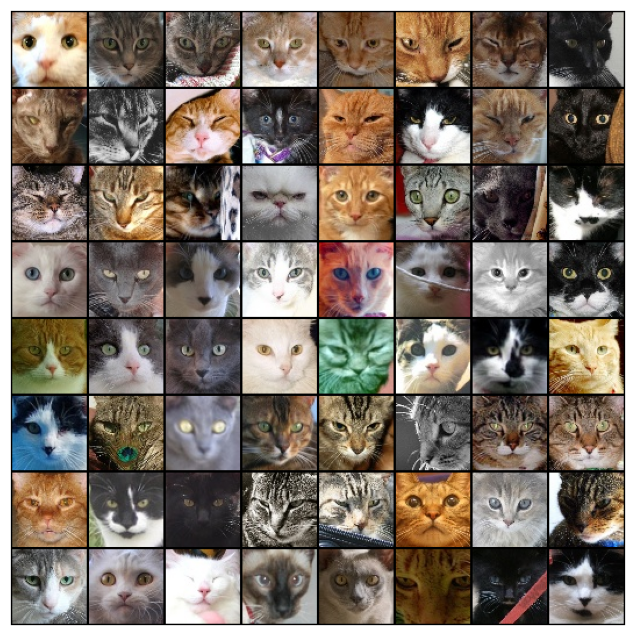

In [ ]:
show_batch(train_dl)

<h2>Implementacja wrappera dla obiektów klasy <i>Dataloader</i></h2>

In [2]:
def to_device(data, device):
    """
    Przeniesienie wybranej instancji struktury danych
    do pamięci wybranego urządzenia
    """
    if isinstance(data, (list, tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Inicjalizacja wrappera"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device

    def __iter__(self):
        """
        Zwrócenie jednego pakietu danych po przeniesieniu go
        do pamięci wybranego urządzenia
        """
        for b in self.dl:
            yield to_device(b, self.device)

    def __len__(self):
        """
        Zwrócenie liczby pakietów danych znajdujących się wewnątrz obiektu klasy Dataloader
        """
        return len(self.dl)

<h2>Określenie domyślnego urządzenia na podstawie sprawdzenia dostępności karty graficznej</h2>

In [17]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

<h2>Wykorzystanie wrappera dla obiektów klasy <i>Dataloader</i></h2>

In [18]:
train_dl = DeviceDataLoader(train_dl, device)

<h2>Deklaracja wymiarowości przestrzeni wektorowej danych wejściowych generatora</h2>

In [60]:
latent_size = 128

<h2>Deklaracja podstawowej klasy generatora</h2>

In [18]:
generator = nn.Sequential(
    # in: latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out: 512 x 4 x 4

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out: 256 x 8 x 8

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out: 128 x 16 x 16

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # out: 64 x 32 x 32

    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
    # out: 3 x 64 x 64
)

<h2>Przeniesienie obiektu dyskryminatora do pamięci urządzenia domyślnego</h2>

In [19]:
generator = to_device(generator, device)

<h2>Deklaracja podstawowej klasy dyskryminatora</h2>

In [20]:
discriminator = nn.Sequential(
    # in: 3 x 64 x 64

    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 64 x 32 x 32

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 16 x 16

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 8 x 8

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 4 x 4

    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid()
)

<h2>Przeniesienie obiektu dyskryminatora do pamięci urządzenia domyślnego</h2>

In [21]:
discriminator = to_device(discriminator, device)

<h2>Przygotowanie danych wejściowych dla generatora</h2>

torch.Size([128, 3, 64, 64])


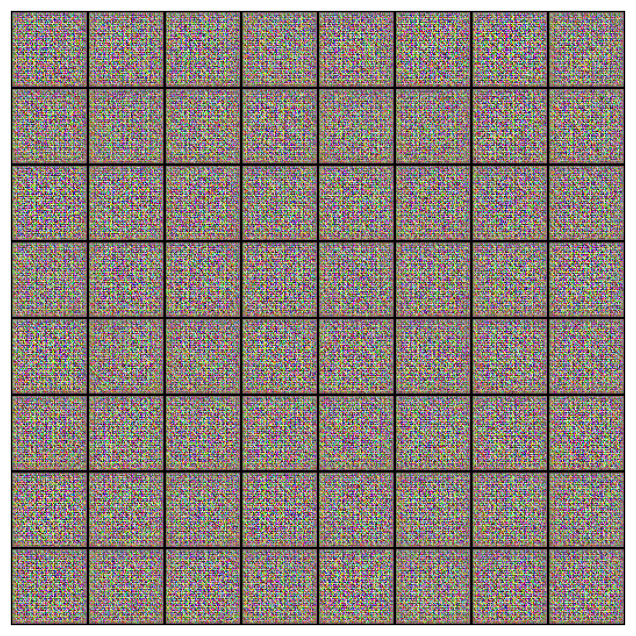

In [ ]:
xb = torch.randn(batch_size, latent_size, 1, 1, device=device)
fake_images = generator(xb)
print(fake_images.shape)
show_images(fake_images.cpu())

<h2>Przygotowanie katalogu na obrazy wygenerowane przez model</h2>

In [6]:
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

<h2>Inicjalizacja przykładowych danych wejściowych dla generatora</h2>

In [18]:
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

<h2>Deklaracja funkcji służącej do zapisywania wygenerowanych obrazów</h2>

In [7]:
def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = f'generated-images-{index}.png'
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

<h2>Wizualizacja procesu uczenia</h2>

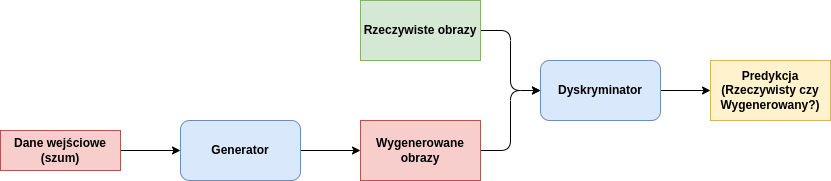

<h2>Przykładowa pętla ucząca</h2>

In [16]:
def fit(model, train_dl, criterion, epochs, lr, batch_size=128):
    model["discriminator"].train()
    model["generator"].train()
    torch.cuda.empty_cache()

    # Inicjalizacja struktur danych do przechowywania wartości funkcji straty
    # oraz wyników dla rzeczywistych i wygenerowanych obrazów
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []

    # Inicjalizacja optymalizatora
    optimizer = {
        "discriminator": torch.optim.Adam(model["discriminator"].parameters(),
                                          lr=lr, betas=(0.5, 0.999)),
        "generator": torch.optim.Adam(model["generator"].parameters(),
                                      lr=lr, betas=(0.5, 0.999))
    }

    for epoch in range(epochs):
        loss_d_per_epoch = []
        loss_g_per_epoch = []
        real_score_per_epoch = []
        fake_score_per_epoch = []
        for real_images, _ in tqdm(train_dl):
            # Uczenie modelu dyskryminatora
            # Inicjalizacja wartości gradientu obliczanego przez optymalizator
            optimizer["discriminator"].zero_grad()

            # Wygenerowanie predykcji dla rzeczywistych obrazów
            # oraz obliczenie wartości funkcji straty
            real_preds = model["discriminator"](real_images)
            real_targets = torch.ones(real_images.size(0), 1, device=device)
            real_loss = criterion["discriminator"](real_preds, real_targets)
            cur_real_score = torch.mean(real_preds).item()

            # Wygenerowanie sztucznych obrazów
            latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
            fake_images = model["generator"](latent)

            # Wygenerowanie predykcji dla sztucznych obrazów
            # oraz obliczenie wartości funkcji straty
            fake_preds = model["discriminator"](fake_images)
            fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
            fake_loss = criterion["discriminator"](fake_preds, fake_targets)
            cur_fake_score = torch.mean(fake_preds).item()

            real_score_per_epoch.append(cur_real_score)
            fake_score_per_epoch.append(cur_fake_score)

            # Aktualizacja wag dyskryminatora
            loss_d = real_loss + fake_loss
            loss_d.backward()
            optimizer["discriminator"].step()
            loss_d_per_epoch.append(loss_d.item())

            # Uczenie modelu generatora
            # Inicjalizacja wartości gradientu obliczanego przez optymalizator
            optimizer["generator"].zero_grad()

            # Wygenerowanie sztucznych obrazów
            latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
            fake_images = model["generator"](latent)

            # Próba oszukania modelu dyskryminatora
            preds = model["discriminator"](fake_images)
            targets = torch.ones(batch_size, 1, device=device)
            loss_g = criterion["generator"](preds, targets)

            # Aktualizacja wag generatora
            loss_g.backward()
            optimizer["generator"].step()
            loss_g_per_epoch.append(loss_g.item())

        # Zapisanie wartości funkcji straty i średnich wartości predykcji w danej epoce
        losses_g.append(np.mean(loss_g_per_epoch))
        losses_d.append(np.mean(loss_d_per_epoch))
        real_scores.append(np.mean(real_score_per_epoch))
        fake_scores.append(np.mean(fake_score_per_epoch))

        # Zapisanie wartości funkcji straty i wyników dla ostatniej porcji danych
        print(f"Epoch [{epoch+1}/{epochs}], loss_g: {losses_g[-1]:.4f}, loss_d: {losses_d[-1]:.4f}, real_score: {real_scores[-1]:.4f}, fake_score: {fake_scores[-1]:.4f}")

        # Zapisanie próbki obrazów wygenerowanych przez generator
        if epoch == epochs - 1:
            # save_samples(f'{lr}-{batch_size}-{epoch+1}', fixed_latent, show=False)
            save_samples(f'DCGAN-modified', fixed_latent, show=False)

    return losses_g, losses_d, real_scores, fake_scores

<h2>Przygotowanie konfiguracji eksperymentu</h2>

In [31]:
model = {
    "discriminator": discriminator.to(device),
    "generator": generator.to(device)
}

criterion = {
    "discriminator": nn.BCELoss(),
    "generator": nn.BCELoss()
}
lr = 0.0002
epochs = 25

<h2>Uruchomienie procesu uczenia</h2>

In [32]:
history = fit(model, train_dl, criterion, epochs, lr)

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [1/25], loss_g: 4.7751, loss_d: 0.6300, real_score: 0.8356, fake_score: 0.1659


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [2/25], loss_g: 4.9090, loss_d: 0.5217, real_score: 0.8372, fake_score: 0.1720


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [3/25], loss_g: 4.9020, loss_d: 0.5229, real_score: 0.8376, fake_score: 0.1543


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [4/25], loss_g: 5.0272, loss_d: 0.6284, real_score: 0.8238, fake_score: 0.1784


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [5/25], loss_g: 4.9594, loss_d: 0.5099, real_score: 0.8426, fake_score: 0.1498


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [6/25], loss_g: 4.9129, loss_d: 0.5150, real_score: 0.8496, fake_score: 0.1546


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [7/25], loss_g: 4.6448, loss_d: 0.5462, real_score: 0.8391, fake_score: 0.1663


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [8/25], loss_g: 4.8554, loss_d: 0.5062, real_score: 0.8525, fake_score: 0.1509


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [9/25], loss_g: 5.1854, loss_d: 0.4269, real_score: 0.8659, fake_score: 0.1333


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [10/25], loss_g: 5.3046, loss_d: 0.3645, real_score: 0.8782, fake_score: 0.1114


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [11/25], loss_g: 4.9785, loss_d: 0.5283, real_score: 0.8541, fake_score: 0.1490


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [12/25], loss_g: 5.1450, loss_d: 0.4505, real_score: 0.8663, fake_score: 0.1310


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [13/25], loss_g: 5.3438, loss_d: 0.4281, real_score: 0.8744, fake_score: 0.1255


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [14/25], loss_g: 5.5601, loss_d: 0.4324, real_score: 0.8629, fake_score: 0.1305


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [15/25], loss_g: 5.3309, loss_d: 0.3267, real_score: 0.8951, fake_score: 0.1135


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [16/25], loss_g: 6.4543, loss_d: 0.1934, real_score: 0.9271, fake_score: 0.0745


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [17/25], loss_g: 5.5151, loss_d: 0.6174, real_score: 0.8476, fake_score: 0.1499


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [18/25], loss_g: 5.8445, loss_d: 0.4395, real_score: 0.8983, fake_score: 0.0964


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [19/25], loss_g: 5.2787, loss_d: 0.3441, real_score: 0.8874, fake_score: 0.1110


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [20/25], loss_g: 5.4304, loss_d: 0.3942, real_score: 0.8844, fake_score: 0.1178


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [21/25], loss_g: 6.2347, loss_d: 0.1290, real_score: 0.9504, fake_score: 0.0553


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [22/25], loss_g: 5.5662, loss_d: 0.6107, real_score: 0.8489, fake_score: 0.1449


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [23/25], loss_g: 5.0098, loss_d: 0.2962, real_score: 0.9055, fake_score: 0.0931


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [24/25], loss_g: 5.2621, loss_d: 0.3403, real_score: 0.9061, fake_score: 0.0963


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [25/25], loss_g: 6.0367, loss_d: 0.4848, real_score: 0.8772, fake_score: 0.1181
Saving generated-images-DCGAN.png


<h2>Ekstrakcja wyników eksperymentu</h2>

In [ ]:
losses_g, losses_d, real_scores, fake_scores = history

<h2>Podgląd wygenerowanych obrazów</h2>

In [ ]:
generated_img = cv2.imread(f'./generated/generated-images-DCGAN.png')
generated_img = generated_img[:, :, [2, 1, 0]]

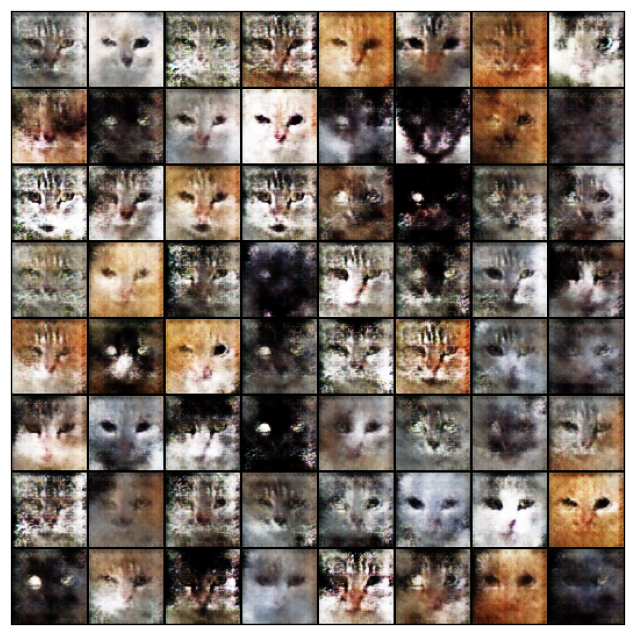

In [ ]:
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_xticks([]); ax.set_yticks([])
ax.imshow(generated_img)

<h2>Wizualizacja wyników</h2>

Text(0.5, 1.0, 'Wartość funkcji straty dla dyskryminatora i generatora w poszczególnych epokach uczenia')

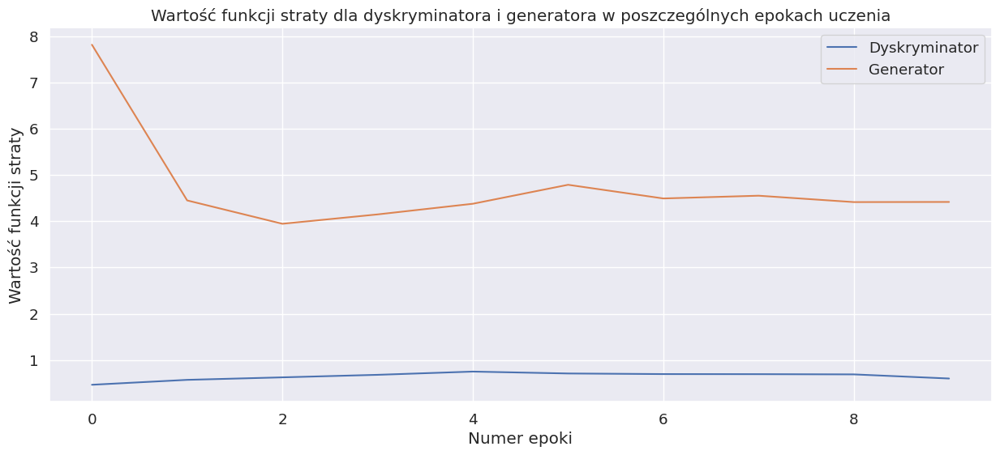

In [ ]:
plt.figure(figsize=(15, 6))
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('Numer epoki')
plt.ylabel('Wartość funkcji straty')
plt.legend(['Dyskryminator', 'Generator'])
plt.title('Wartość funkcji straty dla dyskryminatora i generatora w poszczególnych epokach uczenia')

Text(0.5, 1.0, 'Średnie wartości predykcji dla rzeczywistych i wygenerowanych obrazów')

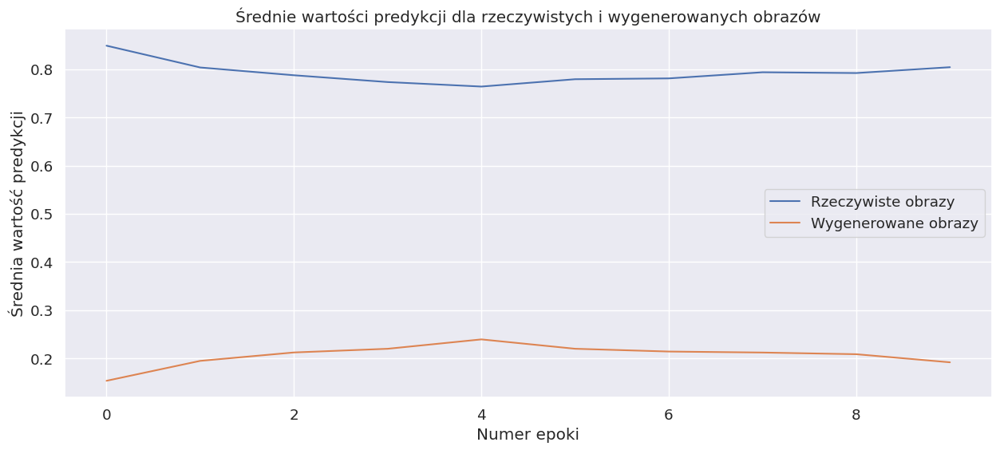

In [ ]:
plt.figure(figsize=(15, 6))

plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('Numer epoki')
plt.ylabel('Średnia wartość predykcji')
plt.legend(['Rzeczywiste obrazy', 'Wygenerowane obrazy'])
plt.title('Średnie wartości predykcji dla rzeczywistych i wygenerowanych obrazów')

# Zadanie2

In [31]:
def create_plots(losses_generator,losses_discriminator,real_scores, fake_scores, param_list, name):
  fig, axes = plt.subplots(1, 2, figsize=(25, 6))

  for param in param_list:
      axes[0].plot(losses_generator[param], label=f'Generator {name}={param}')

  axes[0].set_xlabel('Epoka')
  axes[0].set_ylabel('Wartość funkcji straty')
  axes[0].legend()
  axes[0].set_title('Wartość funkcji straty dla generatora w poszczególnych epokach uczenia')

  for param in param_list:
      axes[1].plot(losses_discriminator[param], label=f'Dyskryminator {name}={param}')

  axes[1].set_xlabel('Epoka')
  axes[1].set_ylabel('Wartość funkcji straty')
  axes[1].legend()
  axes[1].set_title('Wartość funkcji straty dla dyskryminatora w poszczególnych epokach uczenia')

  plt.tight_layout()
  plt.show()

  fig, axes = plt.subplots(1, 2, figsize=(25, 6))
  for param in param_list:
      axes[0].plot(real_scores[param], label=f'Rzeczywiste obrazy {name}={param}')

  axes[0].set_xlabel('Epoka')
  axes[0].set_ylabel('Średnia wartość predykcji')
  axes[0].legend()
  axes[0].set_title('Średnie wartości predykcji dla rzeczywistych obrazów')

  for param in param_list:
      axes[1].plot(fake_scores[param], label=f'Wygenerowane obrazy {name}={param}')

  axes[1].set_xlabel('Epoka')
  axes[1].set_ylabel('Średnia wartość predykcji')
  axes[1].legend()
  axes[1].set_title('Średnie wartości predykcji dla wygenerowanych obrazów')

  plt.tight_layout()
  plt.show()

In [35]:
learning_rates = [0.0002, 0.001, 0.01]
epochs = 25

losses_discriminator_lr = {lr: [] for lr in learning_rates}
losses_generator_lr = {lr: [] for lr in learning_rates}
real_scores_lr = {lr: [] for lr in learning_rates}
fake_scores_lr = {lr: [] for lr in learning_rates}

for lr in learning_rates:
    model = {
        "discriminator": discriminator.to(device),
        "generator": generator.to(device)
    }

    criterion = {
        "discriminator": nn.BCELoss(),
        "generator": nn.BCELoss()
    }

    history = fit(model, train_dl, criterion, epochs, lr)

    losses_g, losses_d, real_scores, fake_scores = history

    losses_discriminator_lr[lr] = losses_d
    losses_generator_lr[lr] = losses_g
    real_scores_lr[lr] = real_scores
    fake_scores_lr[lr] = fake_scores

  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [1/25], loss_g: 7.0599, loss_d: 0.4428, real_score: 0.8464, fake_score: 0.1513


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [2/25], loss_g: 4.5153, loss_d: 0.6167, real_score: 0.7991, fake_score: 0.2028


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [3/25], loss_g: 3.8881, loss_d: 0.7720, real_score: 0.7483, fake_score: 0.2507


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [4/25], loss_g: 4.1424, loss_d: 0.7545, real_score: 0.7524, fake_score: 0.2463


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [5/25], loss_g: 4.5280, loss_d: 0.7255, real_score: 0.7702, fake_score: 0.2331


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [6/25], loss_g: 4.7653, loss_d: 0.6681, real_score: 0.7884, fake_score: 0.2124


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [7/25], loss_g: 5.0114, loss_d: 0.6710, real_score: 0.7927, fake_score: 0.2010


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [8/25], loss_g: 4.9047, loss_d: 0.6301, real_score: 0.8028, fake_score: 0.2021


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [9/25], loss_g: 4.7455, loss_d: 0.7320, real_score: 0.7842, fake_score: 0.2164


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [10/25], loss_g: 4.7009, loss_d: 0.6575, real_score: 0.7962, fake_score: 0.1981


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [11/25], loss_g: 4.4546, loss_d: 0.6443, real_score: 0.8024, fake_score: 0.1988


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [12/25], loss_g: 4.4479, loss_d: 0.5732, real_score: 0.8192, fake_score: 0.1820


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [13/25], loss_g: 4.3076, loss_d: 0.6287, real_score: 0.8061, fake_score: 0.1917


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [14/25], loss_g: 4.4654, loss_d: 0.5580, real_score: 0.8226, fake_score: 0.1770


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [15/25], loss_g: 4.4219, loss_d: 0.5848, real_score: 0.8182, fake_score: 0.1802


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [16/25], loss_g: 4.6655, loss_d: 0.5056, real_score: 0.8372, fake_score: 0.1600


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [17/25], loss_g: 4.7135, loss_d: 0.5477, real_score: 0.8395, fake_score: 0.1624


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [18/25], loss_g: 4.7465, loss_d: 0.5266, real_score: 0.8390, fake_score: 0.1564


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [19/25], loss_g: 4.3842, loss_d: 0.5534, real_score: 0.8236, fake_score: 0.1769


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [20/25], loss_g: 4.8271, loss_d: 0.4502, real_score: 0.8614, fake_score: 0.1392


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [21/25], loss_g: 5.1196, loss_d: 0.4264, real_score: 0.8622, fake_score: 0.1361


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [22/25], loss_g: 5.0191, loss_d: 0.4559, real_score: 0.8644, fake_score: 0.1319


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [23/25], loss_g: 5.3283, loss_d: 0.4237, real_score: 0.8710, fake_score: 0.1311


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [24/25], loss_g: 5.3360, loss_d: 0.4076, real_score: 0.8779, fake_score: 0.1221


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [25/25], loss_g: 5.3252, loss_d: 0.3695, real_score: 0.8868, fake_score: 0.1130
Saving generated-images-0.0002-128-25.png


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [1/25], loss_g: 7.9056, loss_d: 0.9057, real_score: 0.8735, fake_score: 0.1658


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [2/25], loss_g: 4.9345, loss_d: 1.1236, real_score: 0.7584, fake_score: 0.2442


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [3/25], loss_g: 4.4458, loss_d: 1.0459, real_score: 0.7456, fake_score: 0.2587


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [4/25], loss_g: 4.6681, loss_d: 0.9941, real_score: 0.7308, fake_score: 0.2766


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [5/25], loss_g: 4.6022, loss_d: 0.9222, real_score: 0.7709, fake_score: 0.2295


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [6/25], loss_g: 5.1095, loss_d: 0.7444, real_score: 0.8009, fake_score: 0.2038


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [7/25], loss_g: 5.2328, loss_d: 0.7364, real_score: 0.8058, fake_score: 0.1963


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [8/25], loss_g: 5.0070, loss_d: 0.6987, real_score: 0.8057, fake_score: 0.1980


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [9/25], loss_g: 5.1301, loss_d: 0.6897, real_score: 0.8159, fake_score: 0.1845


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [10/25], loss_g: 4.9682, loss_d: 0.7604, real_score: 0.8009, fake_score: 0.2047


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [11/25], loss_g: 5.2520, loss_d: 0.6790, real_score: 0.8127, fake_score: 0.1854


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [12/25], loss_g: 5.4437, loss_d: 0.6895, real_score: 0.8159, fake_score: 0.1853


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [13/25], loss_g: 5.8548, loss_d: 0.7219, real_score: 0.8022, fake_score: 0.1941


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [14/25], loss_g: 5.6158, loss_d: 0.6495, real_score: 0.8089, fake_score: 0.1922


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [15/25], loss_g: 5.3563, loss_d: 0.7020, real_score: 0.7976, fake_score: 0.1982


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [16/25], loss_g: 5.5778, loss_d: 0.6509, real_score: 0.8090, fake_score: 0.1926


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [17/25], loss_g: 5.5071, loss_d: 0.6288, real_score: 0.8082, fake_score: 0.1876


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [18/25], loss_g: 5.6485, loss_d: 0.5673, real_score: 0.8209, fake_score: 0.1752


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [19/25], loss_g: 5.8910, loss_d: 0.5920, real_score: 0.8214, fake_score: 0.1829


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [20/25], loss_g: 6.0727, loss_d: 0.5888, real_score: 0.8217, fake_score: 0.1760


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [21/25], loss_g: 5.7064, loss_d: 0.4939, real_score: 0.8367, fake_score: 0.1615


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [22/25], loss_g: 5.8739, loss_d: 0.5020, real_score: 0.8393, fake_score: 0.1573


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [23/25], loss_g: 5.8176, loss_d: 0.4677, real_score: 0.8507, fake_score: 0.1493


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [24/25], loss_g: 6.1161, loss_d: 0.5132, real_score: 0.8478, fake_score: 0.1523


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [25/25], loss_g: 5.7566, loss_d: 0.4083, real_score: 0.8592, fake_score: 0.1362
Saving generated-images-0.001-128-25.png


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [1/25], loss_g: 3.1967, loss_d: 3.3528, real_score: 0.5728, fake_score: 0.4411


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [2/25], loss_g: 1.7279, loss_d: 1.5477, real_score: 0.5782, fake_score: 0.4270


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [3/25], loss_g: 1.5792, loss_d: 1.4184, real_score: 0.5618, fake_score: 0.4400


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [4/25], loss_g: 1.6502, loss_d: 1.2941, real_score: 0.5877, fake_score: 0.4187


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [5/25], loss_g: 2.2502, loss_d: 1.1167, real_score: 0.6680, fake_score: 0.3398


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [6/25], loss_g: 1.6777, loss_d: 1.2909, real_score: 0.5883, fake_score: 0.4188


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [7/25], loss_g: 3.3954, loss_d: 0.8614, real_score: 0.7470, fake_score: 0.2635


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [8/25], loss_g: 1.8034, loss_d: 1.2507, real_score: 0.5992, fake_score: 0.3997


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [9/25], loss_g: 1.9432, loss_d: 1.2150, real_score: 0.6145, fake_score: 0.3905


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [10/25], loss_g: 1.6510, loss_d: 1.2749, real_score: 0.6021, fake_score: 0.4012


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [11/25], loss_g: 1.9826, loss_d: 1.2522, real_score: 0.5966, fake_score: 0.4032


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [12/25], loss_g: 2.2487, loss_d: 1.1466, real_score: 0.6449, fake_score: 0.3666


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [13/25], loss_g: 2.3065, loss_d: 1.1989, real_score: 0.6301, fake_score: 0.3769


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [14/25], loss_g: 2.6988, loss_d: 1.0682, real_score: 0.6779, fake_score: 0.3239


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [15/25], loss_g: 2.6410, loss_d: 1.1176, real_score: 0.6695, fake_score: 0.3319


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [16/25], loss_g: 3.1612, loss_d: 0.9322, real_score: 0.7474, fake_score: 0.2618


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [17/25], loss_g: 3.1929, loss_d: 0.9928, real_score: 0.7237, fake_score: 0.2859


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [18/25], loss_g: 3.1085, loss_d: 1.0128, real_score: 0.6962, fake_score: 0.3052


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [19/25], loss_g: 3.4824, loss_d: 0.9908, real_score: 0.7205, fake_score: 0.2776


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [20/25], loss_g: 5.3348, loss_d: 0.4133, real_score: 0.8781, fake_score: 0.1359


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [21/25], loss_g: 11.0336, loss_d: 0.0029, real_score: 0.9991, fake_score: 0.0019


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [22/25], loss_g: 11.7899, loss_d: 0.0009, real_score: 0.9997, fake_score: 0.0006


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [23/25], loss_g: 10.2140, loss_d: 31.0739, real_score: 0.9559, fake_score: 0.2985


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [24/25], loss_g: 0.0000, loss_d: 100.0000, real_score: 1.0000, fake_score: 1.0000


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [25/25], loss_g: 0.0000, loss_d: 100.0000, real_score: 1.0000, fake_score: 1.0000
Saving generated-images-0.01-128-25.png


In [28]:
def show_generated_image(lr, batch_size, epochs):
  generated_img = cv2.imread(f'generated/generated-images-{lr}-{batch_size}-{epochs}.png')
  generated_img = generated_img[:, :, [2, 1, 0]]

  fig, ax = plt.subplots(figsize=(6, 6))
  ax.set_title(f'---- learning rate: {lr}, batch size: {batch_size}, n epochs: {epochs} ----')
  ax.set_xticks([]); ax.set_yticks([])
  ax.imshow(generated_img)

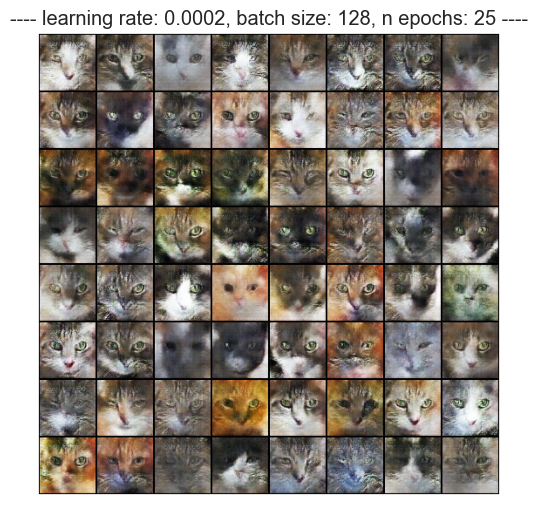

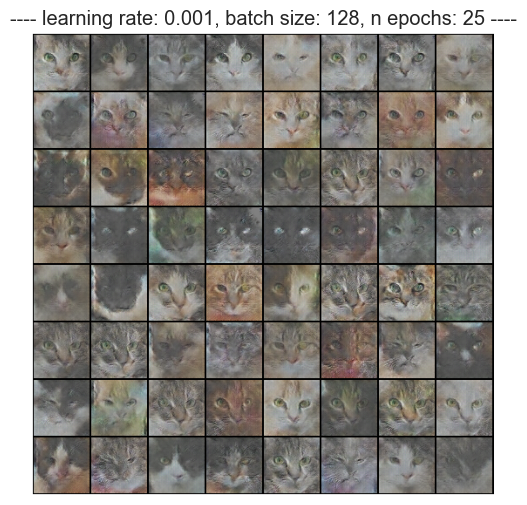

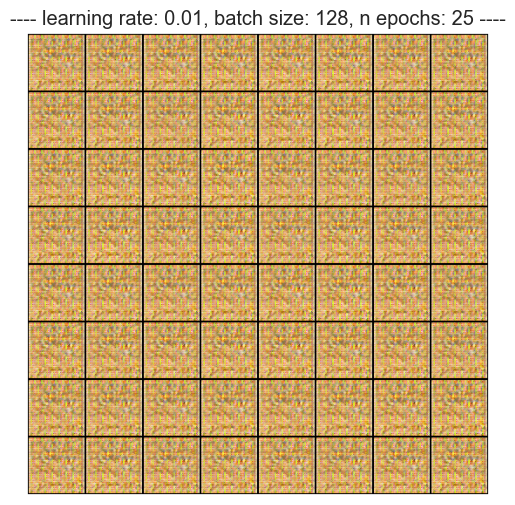

In [40]:
for lr in learning_rates:
  show_generated_image(lr, 128, 25)

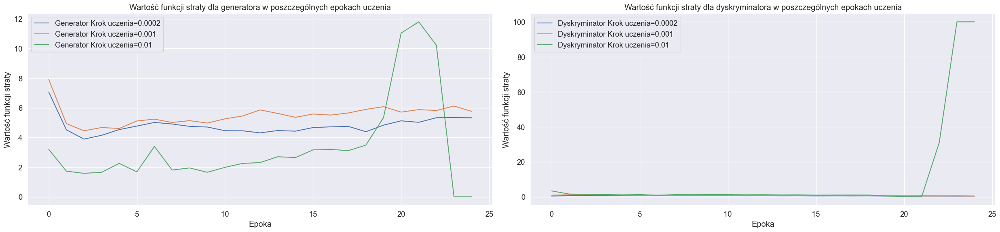

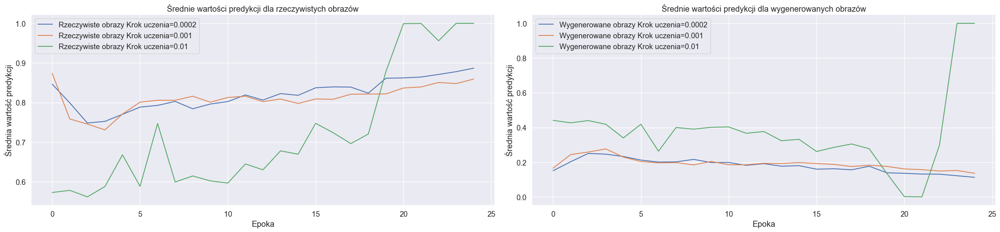

In [41]:
create_plots(losses_generator_lr,losses_discriminator_lr,real_scores_lr,fake_scores_lr, learning_rates, "Krok uczenia")

In [24]:
learning_rate = 0.0002
epochs_list = [10, 20, 30]


losses_discriminator_e = {epoch: [] for epoch in epochs_list}
losses_generator_e = {epoch: [] for epoch in epochs_list}
real_scores_e = {epoch: [] for epoch in epochs_list}
fake_scores_e = {epoch: [] for epoch in epochs_list}

for epochs in epochs_list:
    model = {
        "discriminator": discriminator.to(device),
        "generator": generator.to(device)
    }

    criterion = {
        "discriminator": nn.BCELoss(),
        "generator": nn.BCELoss()
    }

    history = fit(model, train_dl, criterion, epochs, learning_rate)

    losses_g, losses_d, real_scores, fake_scores = history

    losses_discriminator_e[epochs] = losses_d
    losses_generator_e[epochs] = losses_g
    real_scores_e[epochs] = real_scores
    fake_scores_e[epochs] = fake_scores

  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [1/10], loss_g: 7.3336, loss_d: 0.4822, real_score: 0.8556, fake_score: 0.1586


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [2/10], loss_g: 6.3572, loss_d: 0.0739, real_score: 0.9653, fake_score: 0.0336


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [3/10], loss_g: 5.5290, loss_d: 0.4925, real_score: 0.8611, fake_score: 0.1179


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [4/10], loss_g: 3.5139, loss_d: 0.6793, real_score: 0.7742, fake_score: 0.2233


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [5/10], loss_g: 3.4579, loss_d: 0.7690, real_score: 0.7411, fake_score: 0.2510


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [6/10], loss_g: 3.9695, loss_d: 0.8082, real_score: 0.7443, fake_score: 0.2561


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [7/10], loss_g: 4.3690, loss_d: 0.7402, real_score: 0.7692, fake_score: 0.2327


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [8/10], loss_g: 4.2963, loss_d: 0.7720, real_score: 0.7584, fake_score: 0.2365


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [9/10], loss_g: 4.5055, loss_d: 0.6771, real_score: 0.7875, fake_score: 0.2171


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [10/10], loss_g: 4.5196, loss_d: 0.6821, real_score: 0.7883, fake_score: 0.2129
Saving generated-images-0.0002-128-10.png


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [1/20], loss_g: 5.2540, loss_d: 0.5597, real_score: 0.8239, fake_score: 0.1804


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [2/20], loss_g: 4.9312, loss_d: 0.5854, real_score: 0.8157, fake_score: 0.1871


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [3/20], loss_g: 5.2045, loss_d: 0.5289, real_score: 0.8259, fake_score: 0.1712


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [4/20], loss_g: 4.9320, loss_d: 0.5392, real_score: 0.8311, fake_score: 0.1706


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [5/20], loss_g: 4.8949, loss_d: 0.5443, real_score: 0.8320, fake_score: 0.1637


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [6/20], loss_g: 4.8957, loss_d: 0.5965, real_score: 0.8208, fake_score: 0.1777


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [7/20], loss_g: 5.0573, loss_d: 0.5313, real_score: 0.8364, fake_score: 0.1614


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [8/20], loss_g: 4.7666, loss_d: 0.4859, real_score: 0.8450, fake_score: 0.1591


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [9/20], loss_g: 5.1466, loss_d: 0.5579, real_score: 0.8338, fake_score: 0.1644


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [10/20], loss_g: 5.0642, loss_d: 0.4055, real_score: 0.8608, fake_score: 0.1384


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [11/20], loss_g: 5.0565, loss_d: 0.4515, real_score: 0.8620, fake_score: 0.1375


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [12/20], loss_g: 5.3020, loss_d: 0.3906, real_score: 0.8690, fake_score: 0.1311


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [13/20], loss_g: 5.3547, loss_d: 0.4697, real_score: 0.8579, fake_score: 0.1380


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [14/20], loss_g: 5.1498, loss_d: 0.5223, real_score: 0.8492, fake_score: 0.1480


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [15/20], loss_g: 5.0466, loss_d: 0.4360, real_score: 0.8616, fake_score: 0.1394


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [16/20], loss_g: 5.1123, loss_d: 0.4101, real_score: 0.8688, fake_score: 0.1277


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [17/20], loss_g: 5.1332, loss_d: 0.4114, real_score: 0.8677, fake_score: 0.1294


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [18/20], loss_g: 5.3565, loss_d: 0.4583, real_score: 0.8648, fake_score: 0.1378


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [19/20], loss_g: 5.0174, loss_d: 0.3449, real_score: 0.8864, fake_score: 0.1131


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [20/20], loss_g: 5.0483, loss_d: 0.4204, real_score: 0.8713, fake_score: 0.1304
Saving generated-images-0.0002-128-20.png


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [1/30], loss_g: 5.5985, loss_d: 0.3081, real_score: 0.8977, fake_score: 0.1049


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [2/30], loss_g: 5.9661, loss_d: 0.3435, real_score: 0.8847, fake_score: 0.1080


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [3/30], loss_g: 5.7083, loss_d: 0.4253, real_score: 0.8810, fake_score: 0.1253


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [4/30], loss_g: 5.4183, loss_d: 0.3299, real_score: 0.8873, fake_score: 0.1065


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [5/30], loss_g: 5.5592, loss_d: 0.3406, real_score: 0.8927, fake_score: 0.1084


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [6/30], loss_g: 5.7626, loss_d: 0.3598, real_score: 0.8931, fake_score: 0.1059


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [7/30], loss_g: 5.7425, loss_d: 0.3381, real_score: 0.8988, fake_score: 0.1015


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [8/30], loss_g: 6.3633, loss_d: 0.3260, real_score: 0.9073, fake_score: 0.0918


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [9/30], loss_g: 6.2611, loss_d: 0.2690, real_score: 0.9133, fake_score: 0.0869


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [10/30], loss_g: 6.1212, loss_d: 0.3152, real_score: 0.9127, fake_score: 0.0866


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [11/30], loss_g: 6.8988, loss_d: 0.2917, real_score: 0.9139, fake_score: 0.0820


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [12/30], loss_g: 6.2791, loss_d: 0.3655, real_score: 0.8960, fake_score: 0.1068


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [13/30], loss_g: 6.7053, loss_d: 0.2992, real_score: 0.9182, fake_score: 0.0807


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [14/30], loss_g: 6.0161, loss_d: 0.3254, real_score: 0.9036, fake_score: 0.0933


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [15/30], loss_g: 6.9040, loss_d: 0.2547, real_score: 0.9286, fake_score: 0.0755


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [16/30], loss_g: 7.0861, loss_d: 0.2236, real_score: 0.9274, fake_score: 0.0692


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [17/30], loss_g: 7.6121, loss_d: 0.3030, real_score: 0.9203, fake_score: 0.0838


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [18/30], loss_g: 7.7333, loss_d: 0.2551, real_score: 0.9281, fake_score: 0.0694


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [19/30], loss_g: 6.4127, loss_d: 0.2525, real_score: 0.9252, fake_score: 0.0692


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [20/30], loss_g: 6.5816, loss_d: 0.2869, real_score: 0.9252, fake_score: 0.0808


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [21/30], loss_g: 6.9893, loss_d: 0.3086, real_score: 0.9310, fake_score: 0.0650


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [22/30], loss_g: 6.3049, loss_d: 0.2597, real_score: 0.9212, fake_score: 0.0798


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [23/30], loss_g: 6.6533, loss_d: 0.2835, real_score: 0.9159, fake_score: 0.0834


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [24/30], loss_g: 7.3174, loss_d: 0.2890, real_score: 0.9227, fake_score: 0.0806


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [25/30], loss_g: 7.7449, loss_d: 0.1416, real_score: 0.9515, fake_score: 0.0467


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [26/30], loss_g: 7.6560, loss_d: 0.1687, real_score: 0.9473, fake_score: 0.0544


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [27/30], loss_g: 6.7853, loss_d: 0.3214, real_score: 0.9213, fake_score: 0.0719


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [28/30], loss_g: 7.2184, loss_d: 0.2879, real_score: 0.9218, fake_score: 0.0837


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [29/30], loss_g: 7.7333, loss_d: 0.3155, real_score: 0.9324, fake_score: 0.0637


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [30/30], loss_g: 6.8506, loss_d: 0.1385, real_score: 0.9496, fake_score: 0.0542
Saving generated-images-0.0002-128-30.png


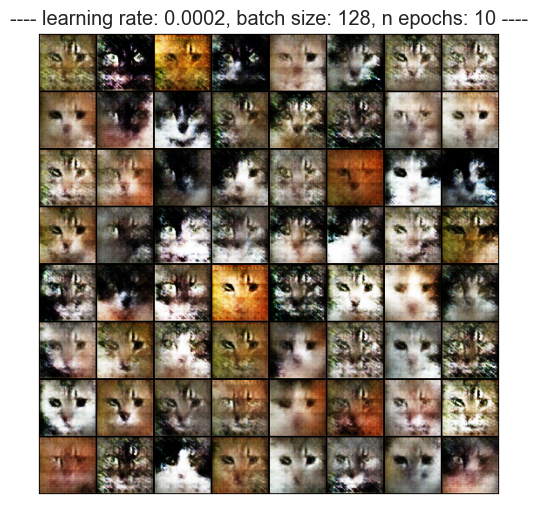

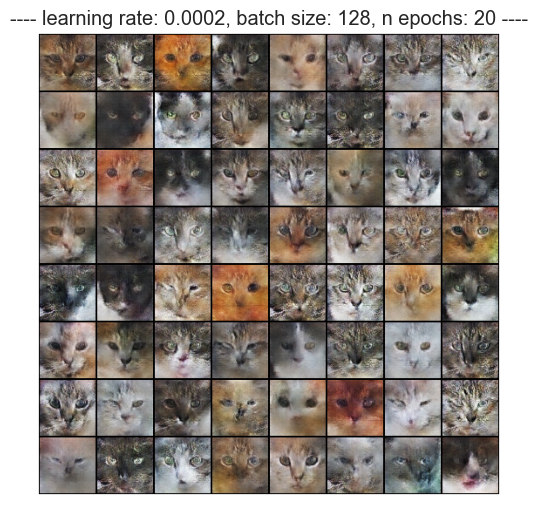

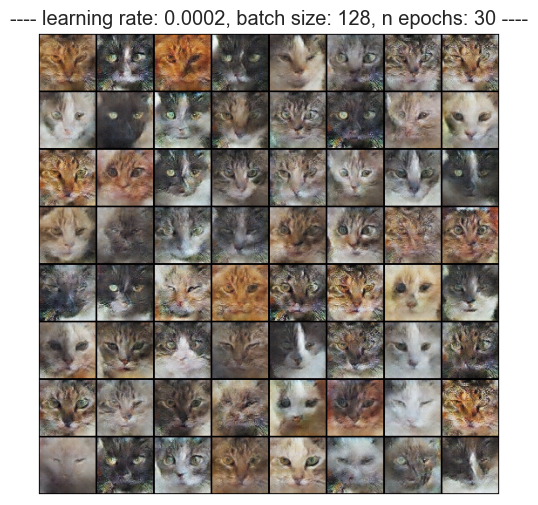

In [27]:
for epochs in epochs_list:
  show_generated_image(0.0002, 128, epochs)

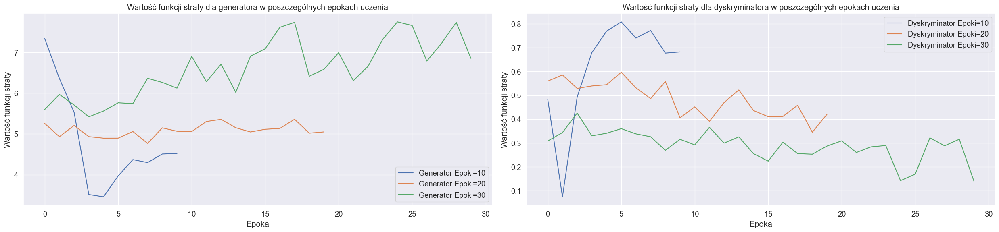

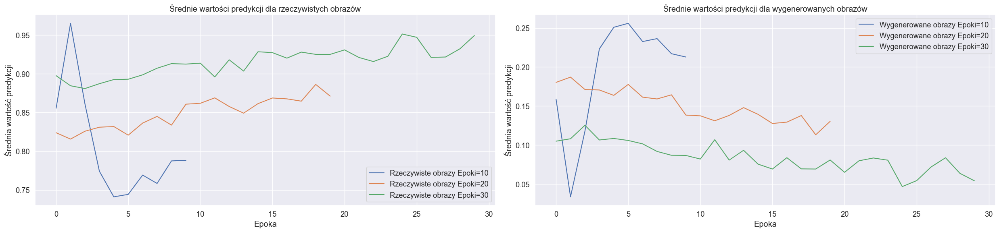

In [30]:
create_plots(losses_generator_e,losses_discriminator_e,real_scores_e,fake_scores_e, epochs_list, "Epoki")

In [26]:
learning_rate = 0.0002
epochs = 25
batch_sizes = [64, 128, 256]

losses_discriminator_b = {batch_size: [] for batch_size in batch_sizes}
losses_generator_b = {batch_size: [] for batch_size in batch_sizes}
real_scores_b = {batch_size: [] for batch_size in batch_sizes}
fake_scores_b = {batch_size: [] for batch_size in batch_sizes}

for batch_size in batch_sizes:
    train_dl = DataLoader(train_ds, batch_size=batch_size, shuffle=True, num_workers=2, pin_memory=True)
    train_dl = DeviceDataLoader(train_dl, device)

    model = {
        "discriminator": discriminator.to(device),
        "generator": generator.to(device)
    }

    criterion = {
        "discriminator": nn.BCELoss(),
        "generator": nn.BCELoss()
    }

    history = fit(model, train_dl, criterion, epochs, learning_rate, batch_size)

    losses_g, losses_d, real_scores, fake_scores = history

    losses_discriminator_b[batch_size] = losses_d
    losses_generator_b[batch_size] = losses_g
    real_scores_b[batch_size] = real_scores
    fake_scores_b[batch_size] = fake_scores


  0%|          | 0/247 [00:00<?, ?it/s]

Epoch [1/25], loss_g: 5.1380, loss_d: 0.5704, real_score: 0.8204, fake_score: 0.1778


  0%|          | 0/247 [00:00<?, ?it/s]

Epoch [2/25], loss_g: 4.9776, loss_d: 0.5357, real_score: 0.8293, fake_score: 0.1698


  0%|          | 0/247 [00:00<?, ?it/s]

Epoch [3/25], loss_g: 4.9890, loss_d: 0.4731, real_score: 0.8455, fake_score: 0.1548


  0%|          | 0/247 [00:00<?, ?it/s]

Epoch [4/25], loss_g: 5.0432, loss_d: 0.5074, real_score: 0.8405, fake_score: 0.1563


  0%|          | 0/247 [00:00<?, ?it/s]

Epoch [5/25], loss_g: 4.9065, loss_d: 0.4646, real_score: 0.8510, fake_score: 0.1489


  0%|          | 0/247 [00:00<?, ?it/s]

Epoch [6/25], loss_g: 4.9777, loss_d: 0.4378, real_score: 0.8594, fake_score: 0.1385


  0%|          | 0/247 [00:00<?, ?it/s]

Epoch [7/25], loss_g: 5.1591, loss_d: 0.4441, real_score: 0.8613, fake_score: 0.1386


  0%|          | 0/247 [00:00<?, ?it/s]

Epoch [8/25], loss_g: 5.1912, loss_d: 0.4281, real_score: 0.8682, fake_score: 0.1300


  0%|          | 0/247 [00:00<?, ?it/s]

Epoch [9/25], loss_g: 5.5120, loss_d: 0.3735, real_score: 0.8807, fake_score: 0.1193


  0%|          | 0/247 [00:00<?, ?it/s]

Epoch [10/25], loss_g: 5.8844, loss_d: 0.3547, real_score: 0.8899, fake_score: 0.1085


  0%|          | 0/247 [00:00<?, ?it/s]

Epoch [11/25], loss_g: 5.6125, loss_d: 0.3455, real_score: 0.8965, fake_score: 0.1051


  0%|          | 0/247 [00:00<?, ?it/s]

Epoch [12/25], loss_g: 5.9461, loss_d: 0.3731, real_score: 0.8955, fake_score: 0.1008


  0%|          | 0/247 [00:00<?, ?it/s]

Epoch [13/25], loss_g: 6.2062, loss_d: 0.3042, real_score: 0.9162, fake_score: 0.0868


  0%|          | 0/247 [00:00<?, ?it/s]

Epoch [14/25], loss_g: 6.6865, loss_d: 0.2323, real_score: 0.9269, fake_score: 0.0718


  0%|          | 0/247 [00:00<?, ?it/s]

Epoch [15/25], loss_g: 6.5162, loss_d: 0.2387, real_score: 0.9248, fake_score: 0.0744


  0%|          | 0/247 [00:00<?, ?it/s]

Epoch [16/25], loss_g: 5.9416, loss_d: 0.3733, real_score: 0.9052, fake_score: 0.0957


  0%|          | 0/247 [00:00<?, ?it/s]

Epoch [17/25], loss_g: 6.4125, loss_d: 0.2508, real_score: 0.9318, fake_score: 0.0685


  0%|          | 0/247 [00:00<?, ?it/s]

Epoch [18/25], loss_g: 6.8174, loss_d: 0.2399, real_score: 0.9294, fake_score: 0.0691


  0%|          | 0/247 [00:00<?, ?it/s]

Epoch [19/25], loss_g: 6.7098, loss_d: 0.2109, real_score: 0.9373, fake_score: 0.0638


  0%|          | 0/247 [00:00<?, ?it/s]

Epoch [20/25], loss_g: 6.9835, loss_d: 0.2753, real_score: 0.9240, fake_score: 0.0772


  0%|          | 0/247 [00:00<?, ?it/s]

Epoch [21/25], loss_g: 6.9512, loss_d: 0.2211, real_score: 0.9389, fake_score: 0.0608


  0%|          | 0/247 [00:00<?, ?it/s]

Epoch [22/25], loss_g: 6.5490, loss_d: 0.2753, real_score: 0.9279, fake_score: 0.0711


  0%|          | 0/247 [00:00<?, ?it/s]

Epoch [23/25], loss_g: 6.9958, loss_d: 0.2150, real_score: 0.9367, fake_score: 0.0627


  0%|          | 0/247 [00:00<?, ?it/s]

Epoch [24/25], loss_g: 6.7118, loss_d: 0.2290, real_score: 0.9376, fake_score: 0.0635


  0%|          | 0/247 [00:00<?, ?it/s]

Epoch [25/25], loss_g: 6.8071, loss_d: 0.2592, real_score: 0.9327, fake_score: 0.0650
Saving generated-images-0.0002-64-25.png


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [1/25], loss_g: 6.9758, loss_d: 0.2694, real_score: 0.9381, fake_score: 0.0585


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [2/25], loss_g: 6.6588, loss_d: 0.2085, real_score: 0.9372, fake_score: 0.0664


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [3/25], loss_g: 7.3053, loss_d: 0.2941, real_score: 0.9362, fake_score: 0.0673


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [4/25], loss_g: 5.8614, loss_d: 0.3017, real_score: 0.9221, fake_score: 0.0776


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [5/25], loss_g: 6.8442, loss_d: 0.2456, real_score: 0.9396, fake_score: 0.0600


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [6/25], loss_g: 6.2914, loss_d: 0.2194, real_score: 0.9399, fake_score: 0.0595


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [7/25], loss_g: 6.8721, loss_d: 0.1765, real_score: 0.9413, fake_score: 0.0548


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [8/25], loss_g: 6.8860, loss_d: 0.2986, real_score: 0.9282, fake_score: 0.0746


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [9/25], loss_g: 6.6707, loss_d: 0.2556, real_score: 0.9296, fake_score: 0.0687


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [10/25], loss_g: 6.5983, loss_d: 0.2921, real_score: 0.9223, fake_score: 0.0845


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [11/25], loss_g: 6.9424, loss_d: 0.1586, real_score: 0.9433, fake_score: 0.0555


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [12/25], loss_g: 6.9399, loss_d: 0.1886, real_score: 0.9456, fake_score: 0.0522


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [13/25], loss_g: 6.4575, loss_d: 0.1350, real_score: 0.9557, fake_score: 0.0464


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [14/25], loss_g: 7.4769, loss_d: 0.1568, real_score: 0.9551, fake_score: 0.0453


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [15/25], loss_g: 7.3968, loss_d: 0.1340, real_score: 0.9553, fake_score: 0.0384


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [16/25], loss_g: 6.2259, loss_d: 0.3772, real_score: 0.9148, fake_score: 0.0906


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [17/25], loss_g: 6.4396, loss_d: 0.2307, real_score: 0.9332, fake_score: 0.0684


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [18/25], loss_g: 6.8217, loss_d: 0.1977, real_score: 0.9409, fake_score: 0.0584


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [19/25], loss_g: 6.9333, loss_d: 0.1771, real_score: 0.9459, fake_score: 0.0492


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [20/25], loss_g: 5.9668, loss_d: 0.3039, real_score: 0.9178, fake_score: 0.0855


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [21/25], loss_g: 5.9534, loss_d: 0.1724, real_score: 0.9473, fake_score: 0.0547


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [22/25], loss_g: 7.3130, loss_d: 0.1579, real_score: 0.9511, fake_score: 0.0479


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [23/25], loss_g: 7.2488, loss_d: 0.0664, real_score: 0.9729, fake_score: 0.0295


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [24/25], loss_g: 7.0453, loss_d: 0.1664, real_score: 0.9511, fake_score: 0.0429


  0%|          | 0/124 [00:00<?, ?it/s]

Epoch [25/25], loss_g: 6.4965, loss_d: 0.3037, real_score: 0.9239, fake_score: 0.0813
Saving generated-images-0.0002-128-25.png


  0%|          | 0/62 [00:00<?, ?it/s]

Epoch [1/25], loss_g: 7.3966, loss_d: 0.1229, real_score: 0.9561, fake_score: 0.0430


  0%|          | 0/62 [00:00<?, ?it/s]

Epoch [2/25], loss_g: 7.7878, loss_d: 0.2171, real_score: 0.9430, fake_score: 0.0569


  0%|          | 0/62 [00:00<?, ?it/s]

Epoch [3/25], loss_g: 6.7241, loss_d: 0.1209, real_score: 0.9588, fake_score: 0.0454


  0%|          | 0/62 [00:00<?, ?it/s]

Epoch [4/25], loss_g: 7.2185, loss_d: 0.2396, real_score: 0.9508, fake_score: 0.0470


  0%|          | 0/62 [00:00<?, ?it/s]

Epoch [5/25], loss_g: 7.4182, loss_d: 0.1524, real_score: 0.9506, fake_score: 0.0533


  0%|          | 0/62 [00:00<?, ?it/s]

Epoch [6/25], loss_g: 8.6845, loss_d: 0.0943, real_score: 0.9625, fake_score: 0.0341


  0%|          | 0/62 [00:00<?, ?it/s]

Epoch [7/25], loss_g: 6.6542, loss_d: 0.2629, real_score: 0.9325, fake_score: 0.0659


  0%|          | 0/62 [00:00<?, ?it/s]

Epoch [8/25], loss_g: 6.3263, loss_d: 0.2982, real_score: 0.9249, fake_score: 0.0775


  0%|          | 0/62 [00:00<?, ?it/s]

Epoch [9/25], loss_g: 6.9197, loss_d: 0.1178, real_score: 0.9583, fake_score: 0.0424


  0%|          | 0/62 [00:00<?, ?it/s]

Epoch [10/25], loss_g: 8.1409, loss_d: 0.2123, real_score: 0.9476, fake_score: 0.0514


  0%|          | 0/62 [00:00<?, ?it/s]

Epoch [11/25], loss_g: 7.1977, loss_d: 0.1251, real_score: 0.9582, fake_score: 0.0469


  0%|          | 0/62 [00:00<?, ?it/s]

Epoch [12/25], loss_g: 7.3255, loss_d: 0.2731, real_score: 0.9308, fake_score: 0.0665


  0%|          | 0/62 [00:00<?, ?it/s]

Epoch [13/25], loss_g: 7.4718, loss_d: 0.1056, real_score: 0.9624, fake_score: 0.0371


  0%|          | 0/62 [00:00<?, ?it/s]

Epoch [14/25], loss_g: 6.9808, loss_d: 0.2846, real_score: 0.9253, fake_score: 0.0736


  0%|          | 0/62 [00:00<?, ?it/s]

Epoch [15/25], loss_g: 7.3054, loss_d: 0.1567, real_score: 0.9511, fake_score: 0.0484


  0%|          | 0/62 [00:00<?, ?it/s]

Epoch [16/25], loss_g: 6.3154, loss_d: 0.2348, real_score: 0.9467, fake_score: 0.0568


  0%|          | 0/62 [00:00<?, ?it/s]

Epoch [17/25], loss_g: 8.0731, loss_d: 0.0703, real_score: 0.9720, fake_score: 0.0291


  0%|          | 0/62 [00:00<?, ?it/s]

Epoch [18/25], loss_g: 7.5244, loss_d: 0.1459, real_score: 0.9551, fake_score: 0.0427


  0%|          | 0/62 [00:00<?, ?it/s]

Epoch [19/25], loss_g: 6.7937, loss_d: 0.1820, real_score: 0.9526, fake_score: 0.0497


  0%|          | 0/62 [00:00<?, ?it/s]

Epoch [20/25], loss_g: 8.1983, loss_d: 0.0715, real_score: 0.9698, fake_score: 0.0293


  0%|          | 0/62 [00:00<?, ?it/s]

Epoch [21/25], loss_g: 8.7267, loss_d: 0.3162, real_score: 0.9324, fake_score: 0.0619


  0%|          | 0/62 [00:00<?, ?it/s]

Epoch [22/25], loss_g: 6.8566, loss_d: 0.0944, real_score: 0.9620, fake_score: 0.0417


  0%|          | 0/62 [00:00<?, ?it/s]

Epoch [23/25], loss_g: 7.5245, loss_d: 0.2776, real_score: 0.9350, fake_score: 0.0627


  0%|          | 0/62 [00:00<?, ?it/s]

Epoch [24/25], loss_g: 7.3177, loss_d: 0.1869, real_score: 0.9420, fake_score: 0.0601


  0%|          | 0/62 [00:00<?, ?it/s]

Epoch [25/25], loss_g: 7.6518, loss_d: 0.0862, real_score: 0.9668, fake_score: 0.0342
Saving generated-images-0.0002-256-25.png


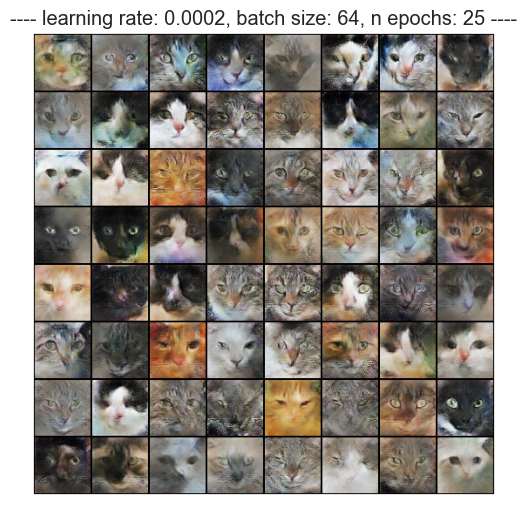

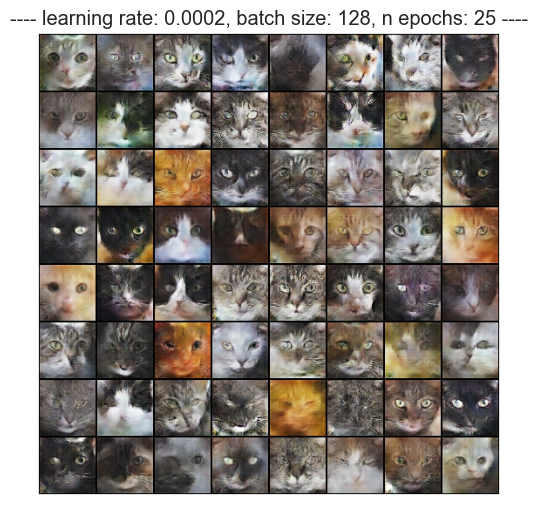

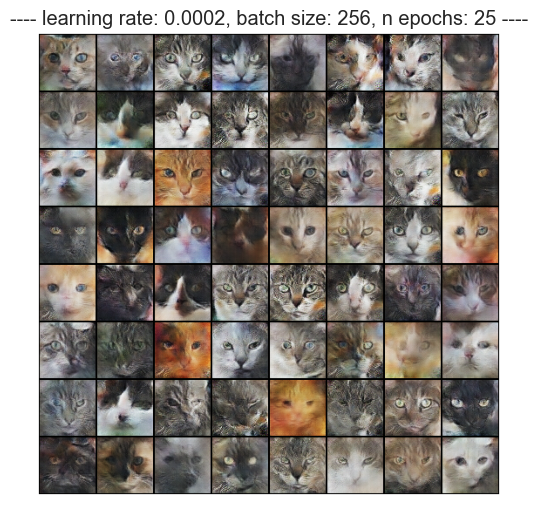

In [29]:
for batch_size in batch_sizes:
  show_generated_image(0.0002, batch_size, 25)

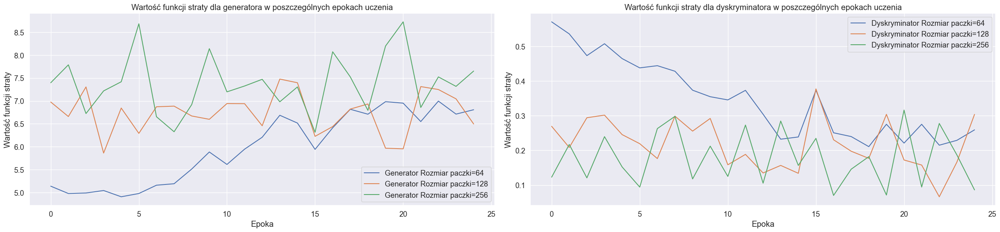

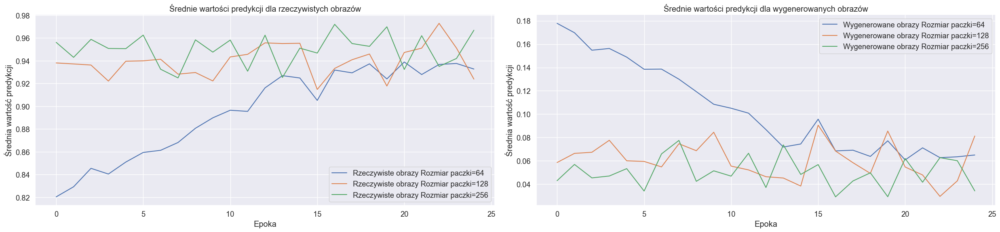

In [32]:
create_plots(losses_generator_b,losses_discriminator_b,real_scores_b,fake_scores_b, batch_sizes, "Rozmiar paczki")

# Zadanie 3


In [17]:
class ResidualBlock(nn.Module):
    def __init__(self, in_channels):
        super(ResidualBlock, self).__init__()
        self.conv1 = nn.ConvTranspose2d(in_channels, in_channels, kernel_size=3, stride=1, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(in_channels)
        self.relu = nn.ReLU(True)
        self.conv2 = nn.ConvTranspose2d(in_channels, in_channels, kernel_size=3, stride=1, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(in_channels)

    def forward(self, x):
        residual = x
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.conv2(x)
        x = self.bn2(x)
        x += residual
        return x


generator = nn.Sequential(
            nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
            nn.BatchNorm2d(512),
            nn.ReLU(True),
            nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(True),
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            ResidualBlock(128),
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
            nn.Tanh(),
        )

In [18]:
generator = to_device(generator, device)

In [19]:
discriminator = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Dropout2d(0.3),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
            nn.Flatten(),
            nn.Sigmoid(),
        )

In [20]:
discriminator = to_device(discriminator, device)

In [21]:
model = {
    "discriminator": discriminator.to(device),
    "generator": generator.to(device)
}

criterion = {
    "discriminator": nn.BCELoss(),
    "generator": nn.BCELoss()
}
lr = 0.0002
epochs = 25
batch_size=128

In [22]:
train_dl = DataLoader(train_ds, batch_size=batch_size, shuffle=True, num_workers=2, pin_memory=True)
train_dl = DeviceDataLoader(train_dl, device)

In [23]:
history = fit(model, train_dl, criterion, epochs, lr)

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [1/25], loss_g: 5.7535, loss_d: 0.4433, real_score: 0.8308, fake_score: 0.1651


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [2/25], loss_g: 6.9104, loss_d: 0.4324, real_score: 0.8402, fake_score: 0.1387


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [3/25], loss_g: 3.9678, loss_d: 0.5977, real_score: 0.7923, fake_score: 0.2064


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [4/25], loss_g: 4.2579, loss_d: 0.5909, real_score: 0.8007, fake_score: 0.2008


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [5/25], loss_g: 3.6360, loss_d: 0.6868, real_score: 0.7599, fake_score: 0.2365


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [6/25], loss_g: 3.3653, loss_d: 0.7137, real_score: 0.7440, fake_score: 0.2492


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [7/25], loss_g: 3.3257, loss_d: 0.7350, real_score: 0.7483, fake_score: 0.2480


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [8/25], loss_g: 3.4957, loss_d: 0.7687, real_score: 0.7417, fake_score: 0.2634


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [9/25], loss_g: 3.5424, loss_d: 0.8167, real_score: 0.7224, fake_score: 0.2713


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [10/25], loss_g: 3.4893, loss_d: 0.7997, real_score: 0.7203, fake_score: 0.2698


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [11/25], loss_g: 3.4639, loss_d: 0.8931, real_score: 0.7086, fake_score: 0.2993


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [12/25], loss_g: 3.5901, loss_d: 0.8203, real_score: 0.7230, fake_score: 0.2771


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [13/25], loss_g: 3.5717, loss_d: 0.8889, real_score: 0.7025, fake_score: 0.2877


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [14/25], loss_g: 3.4866, loss_d: 0.9185, real_score: 0.6941, fake_score: 0.3073


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [15/25], loss_g: 3.6405, loss_d: 0.8171, real_score: 0.7247, fake_score: 0.2761


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [16/25], loss_g: 3.8194, loss_d: 0.8439, real_score: 0.7223, fake_score: 0.2811


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [17/25], loss_g: 3.6999, loss_d: 0.7445, real_score: 0.7361, fake_score: 0.2551


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [18/25], loss_g: 3.8812, loss_d: 0.7774, real_score: 0.7365, fake_score: 0.2527


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [19/25], loss_g: 3.8077, loss_d: 0.8178, real_score: 0.7297, fake_score: 0.2705


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [20/25], loss_g: 3.7133, loss_d: 0.6790, real_score: 0.7615, fake_score: 0.2386


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [21/25], loss_g: 4.0380, loss_d: 0.6586, real_score: 0.7724, fake_score: 0.2290


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [22/25], loss_g: 4.0125, loss_d: 0.8053, real_score: 0.7341, fake_score: 0.2622


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [23/25], loss_g: 4.0484, loss_d: 0.6855, real_score: 0.7596, fake_score: 0.2376


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [24/25], loss_g: 4.3352, loss_d: 0.6048, real_score: 0.7873, fake_score: 0.2153


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch [25/25], loss_g: 4.2730, loss_d: 0.6750, real_score: 0.7699, fake_score: 0.2256
Saving generated-images-DCGAN-modified.png


In [ ]:
losses_g_m, losses_d_m, real_scores_m, fake_scores_m = history

In [ ]:
def create_plots(losses_generator, losses_generator_m, losses_discriminator, losses_discriminator_m,
                 real_scores, real_scores_m, fake_scores, fake_scores_m):

  fig, axes = plt.subplots(1, 2, figsize=(25, 6))


  axes[0].plot(losses_generator, label=f'Generator DCGAN')
  axes[0].plot(losses_generator_m, label=f'Generator Modified DCGAN')

  axes[0].set_xlabel('Epoch')
  axes[0].set_ylabel('Loss Value')
  axes[0].legend()
  axes[0].set_title('Loss for Generator over Epochs')


  axes[1].plot(losses_discriminator, label=f'Discriminator DCGAN')
  axes[1].plot(losses_discriminator_m, label=f'Discriminator Modified DCGAN')

  axes[1].set_xlabel('Epoch')
  axes[1].set_ylabel('Loss Value')
  axes[1].legend()
  axes[1].set_title('Loss for Discriminator over Epochs')

  plt.tight_layout()
  plt.show()

  fig, axes = plt.subplots(1, 2, figsize=(25, 6))


  axes[0].plot(real_scores, label=f'Real Images DCGAN')
  axes[0].plot(real_scores_m, label=f'Real Images Modified DCGAN')

  axes[0].set_xlabel('Epoch')
  axes[0].set_ylabel('Average Prediction Value')
  axes[0].legend()
  axes[0].set_title('Average Predictions for Real Images')


  axes[1].plot(fake_scores, label=f'Generated Images DCGAN')
  axes[1].plot(fake_scores_m, label=f'Generated Images Modified DCGAN')

  axes[1].set_xlabel('Epoch')
  axes[1].set_ylabel('Average Prediction Value')
  axes[1].legend()
  axes[1].set_title('Average Predictions for Generated Images')

  plt.tight_layout()
  plt.show()

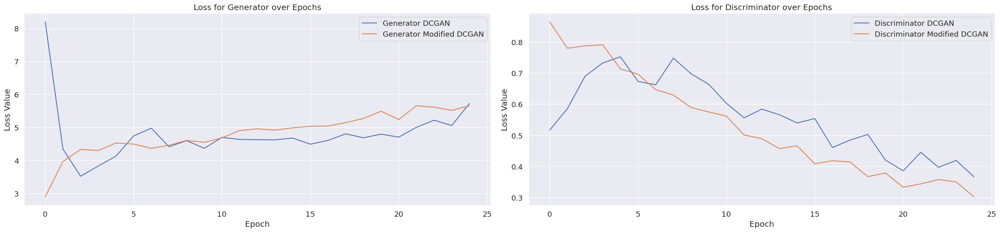

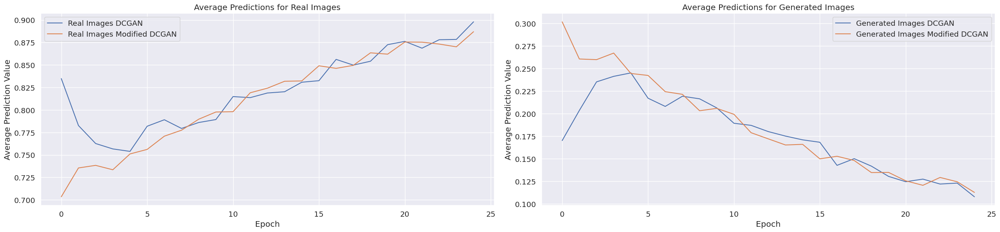

In [ ]:
create_plots(losses_g, losses_g_m, losses_d, losses_d_m, real_scores, real_scores_m, fake_scores, fake_scores_m)

In [24]:
generated_img = cv2.imread(f'./generated/generated-images-DCGAN.png')
generated_img = generated_img[:, :, [2, 1, 0]]
generated_img_m = cv2.imread(f'./generated/generated-images-DCGAN-modified.png')
generated_img_m = generated_img[:, :, [2, 1, 0]]

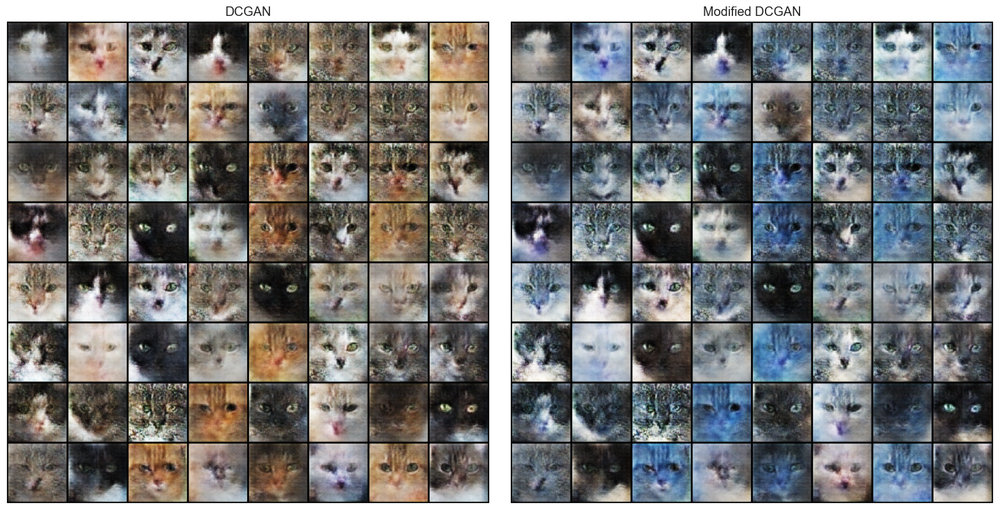

In [25]:
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

axes[0].imshow(generated_img)
axes[0].set_xticks([]); axes[0].set_yticks([])
axes[0].set_title("DCGAN")

axes[1].imshow(generated_img_m)
axes[1].set_xticks([]); axes[1].set_yticks([])
axes[1].set_title("Modified DCGAN")

plt.tight_layout()
plt.show()

# Zadanie 4


#CycleGAN


In [3]:
class ResidualBlock(nn.Module):
    def __init__(self, in_features):
        super(ResidualBlock, self).__init__()
        self.conv_block = nn.Sequential(
            nn.Conv2d(in_features, in_features, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(in_features, 0.8),
            nn.PReLU(),
            nn.Conv2d(in_features, in_features, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(in_features, 0.8),
        )

    def forward(self, x):
        return x + self.conv_block(x)


In [4]:
class Generator(nn.Module):
    def __init__(self, input_shape, num_residual_block):
        super(Generator, self).__init__()

        channels = input_shape[0]

        # Initial Convolution Block
        out_features = 64
        model = [
            nn.ReflectionPad2d(channels),
            nn.Conv2d(channels, out_features, 7),
            nn.InstanceNorm2d(out_features),
            nn.ReLU(inplace=True)
        ]
        in_features = out_features

        # Downsampling
        for _ in range(2):
            out_features *= 2
            model += [
                nn.Conv2d(in_features, out_features, 3, stride=2, padding=1),
                nn.InstanceNorm2d(out_features),
                nn.ReLU(inplace=True)
            ]
            in_features = out_features

        # Residual blocks
        for _ in range(num_residual_block):
            model += [ResidualBlock(out_features)]

        # Upsampling
        for _ in range(2):
            out_features //= 2
            model += [
                nn.Upsample(scale_factor=2),
                nn.Conv2d(in_features, out_features, 3, stride=1, padding=1),
                nn.ReLU(inplace=True)
            ]
            in_features = out_features

        # Output Layer
        model += [nn.ReflectionPad2d(channels),
                  nn.Conv2d(out_features, channels, 7),
                  nn.Tanh()
                 ]

        # Unpacking
        self.model = nn.Sequential(*model)

    def forward(self, x):
        return self.model(x)

In [5]:
class Discriminator(nn.Module):
    def __init__(self, input_shape):
        super(Discriminator, self).__init__()

        channels, height, width = input_shape

        self.output_shape = (1, height//2**4, width//2**4)

        def discriminator_block(in_filters, out_filters, normalize=True):
            layers = [nn.Conv2d(in_filters, out_filters, 4, stride=2, padding=1)]
            if normalize:
                layers.append(nn.InstanceNorm2d(out_filters))
            layers.append(nn.LeakyReLU(0.2, inplace=True))
            return layers

        self.model = nn.Sequential(
            *discriminator_block(channels, 64, normalize=False),
            *discriminator_block(64, 128),
            *discriminator_block(128,256),
            *discriminator_block(256,512),
            nn.ZeroPad2d((1,0,1,0)),
            nn.Conv2d(512, 1, 4, padding=1)
        )

    def forward(self, img):
        return torch.sigmoid(self.model(img))

In [7]:
def train_cycle_gan(models, dataloaders, criterions, optimizers, epochs, device):
    G_AB, G_BA, D_A, D_B = models['G'], models['F'], models['D_A'], models['D_B']
    loader_A, loader_B = dataloaders
    optimizer_G, optimizer_D_A, optimizer_D_B = optimizers['G'], optimizers['D_A'], optimizers['D_B']

    lambda_cycle = 10.0
    lambda_id = 0.5 * lambda_cycle

    metrics = {
        'loss_G': [],
        'loss_D': [],
    }

    for epoch in range(epochs):
        epoch_losses = {key: [] for key in metrics}
        for (real_A, _), (real_B, _) in tqdm(zip(loader_A, loader_B)):
            real_A, real_B = real_A.to(device), real_B.to(device)

            optimizer_G.zero_grad()
            criterion_GAN = criterions['GAN']
            criterion_cycle = criterions['cycle']
            criterion_identity = criterions['identity']


            # Identity loss
            loss_id_A = criterion_identity(G_BA(real_A), real_A) * lambda_id
            loss_id_B = criterion_identity(G_AB(real_B), real_B) * lambda_id

            # GAN loss
            fake_A = G_BA(real_B)
            loss_gan_BA = criterion_GAN(D_A(fake_A), torch.ones_like(D_A(fake_A)))

            fake_B = G_AB(real_A)
            loss_gan_AB = criterion_GAN(D_B(fake_B), torch.ones_like(D_B(fake_B)))

            # Cycle-consistency loss
            recov_A = G_BA(fake_B)
            loss_cycle_ABA = criterion_cycle(recov_A, real_A) * lambda_cycle

            recov_B = G_AB(fake_A)
            loss_cycle_BAB = criterion_cycle(recov_B, real_B) * lambda_cycle

            # Total generator loss
            loss_G = loss_id_A + loss_id_B + loss_gan_BA + loss_gan_AB + loss_cycle_ABA + loss_cycle_BAB
            loss_G.backward()
            optimizer_G.step()

            optimizer_D_A.zero_grad()

            # Discriminator A loss
            fake_A = fake_A.detach()
            loss_D_A_real = criterion_GAN(D_A(real_A), torch.ones_like(D_A(real_A)))
            loss_D_A_fake = criterion_GAN(D_A(fake_A), torch.zeros_like(D_A(fake_A)))
            loss_D_A = (loss_D_A_real + loss_D_A_fake) * 0.5
            loss_D_A.backward()
            optimizer_D_A.step()

            optimizer_D_B.zero_grad()

            # Discriminator B loss
            fake_B = fake_B.detach()
            loss_D_B_real = criterion_GAN(D_B(real_B), torch.ones_like(D_B(real_B)))
            loss_D_B_fake = criterion_GAN(D_B(fake_B), torch.zeros_like(D_B(fake_B)))
            loss_D_B = (loss_D_B_real + loss_D_B_fake) * 0.5
            loss_D_B.backward()
            optimizer_D_B.step()

            batch_losses = {
                'loss_G': loss_G.item(),
                'loss_D': (loss_D_A + loss_D_B).item(),
            }


            for key, value in batch_losses.items():
                epoch_losses[key].append(value)

        for key, value in epoch_losses.items():
            metrics[key].append(np.mean(value))

        print(f"Epoch {epoch+1}/{epochs}")
        if epoch == epochs - 1:
                fake_images = G_AB(real_A)
                fake_fname = f'generated-images-cycleganAB.png'
                save_image(denorm(fake_images), os.path.join('generated', fake_fname), nrow=8)

                fake_images = G_BA(real_B)
                fake_fname = f'generated-images-cycleganBA.png'
                save_image(denorm(fake_images), os.path.join('generated', fake_fname), nrow=8)

    return metrics

In [8]:
DATA_DIR_A = 'cats'
DATA_DIR_B = 'dogs'
image_size = 64
batch_size = 16
stats = ((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))

transform = tt.Compose([tt.Resize(image_size),
                        tt.CenterCrop(image_size),
                        tt.ToTensor(),
                        tt.Normalize(*stats)])

train_ds_A = ImageFolder(DATA_DIR_A, transform=transform)
train_ds_B = ImageFolder(DATA_DIR_B, transform=transform)

train_dl_A = DataLoader(train_ds_A, batch_size, shuffle=True, num_workers=2, pin_memory=True)
train_dl_B = DataLoader(train_ds_B, batch_size, shuffle=True, num_workers=2, pin_memory=True)

dataloaders = (train_dl_A, train_dl_B)

In [9]:
import itertools

input_shape = (3, 64, 64)
num_residual_blocks = 9

G = Generator(input_shape, num_residual_blocks).to(device)
F = Generator(input_shape, num_residual_blocks).to(device)
D_A = Discriminator(input_shape).to(device)
D_B = Discriminator(input_shape).to(device)

models = {
    "G": G,  # Generator A -> B
    "F": F,  # Generator B -> A
    "D_A": D_A,  # Discriminator A
    "D_B": D_B   # Discriminator B
}

# Losses
criterion_GAN = nn.MSELoss().to(device)
criterion_cycle = nn.L1Loss().to(device)
criterion_identity = nn.L1Loss().to(device)

criterions = {
    "GAN": criterion_GAN,
    "cycle": criterion_cycle,
    "identity": criterion_identity
}

# Optimizers
optimizer_G = torch.optim.Adam(itertools.chain(G.parameters(), F.parameters()), lr=0.0002, betas=(0.5, 0.999))
optimizer_D_A = torch.optim.Adam(D_A.parameters(), lr=0.0002, betas=(0.5, 0.999))
optimizer_D_B = torch.optim.Adam(D_B.parameters(), lr=0.0002, betas=(0.5, 0.999))

optimizers = {
    "G": optimizer_G,
    "D_A": optimizer_D_A,
    "D_B": optimizer_D_B
}

In [6]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

In [36]:
epochs = 25

metrics_cyclegan = train_cycle_gan(models, dataloaders, criterions, optimizers, epochs, device)


0it [00:00, ?it/s]

Epoch 1/25


0it [00:00, ?it/s]

Epoch 2/25


0it [00:00, ?it/s]

Epoch 3/25


0it [00:00, ?it/s]

Epoch 4/25


0it [00:00, ?it/s]

Epoch 5/25


0it [00:00, ?it/s]

Epoch 6/25


0it [00:00, ?it/s]

Epoch 7/25


0it [00:00, ?it/s]

Epoch 8/25


0it [00:00, ?it/s]

Epoch 9/25


0it [00:50, ?it/s]

Epoch 10/25


0it [00:00, ?it/s]

Epoch 11/25


0it [00:00, ?it/s]

Epoch 12/25


0it [00:00, ?it/s]

Epoch 13/25


0it [00:00, ?it/s]

Epoch 14/25


0it [00:00, ?it/s]

Epoch 15/25


0it [00:00, ?it/s]

Epoch 16/25


0it [00:00, ?it/s]

Epoch 17/25


0it [00:00, ?it/s]

Epoch 18/25


0it [00:00, ?it/s]

Epoch 19/25


0it [00:00, ?it/s]

Epoch 20/25


0it [00:00, ?it/s]

Epoch 21/25


0it [00:00, ?it/s]

Epoch 22/25


0it [00:00, ?it/s]

Epoch 23/25


0it [00:00, ?it/s]

Epoch 24/25


0it [00:00, ?it/s]

Epoch 25/25


In [37]:
import pickle

with open('gan_cycle_results.pkl', 'wb') as file:
    pickle.dump(metrics_cyclegan, file)

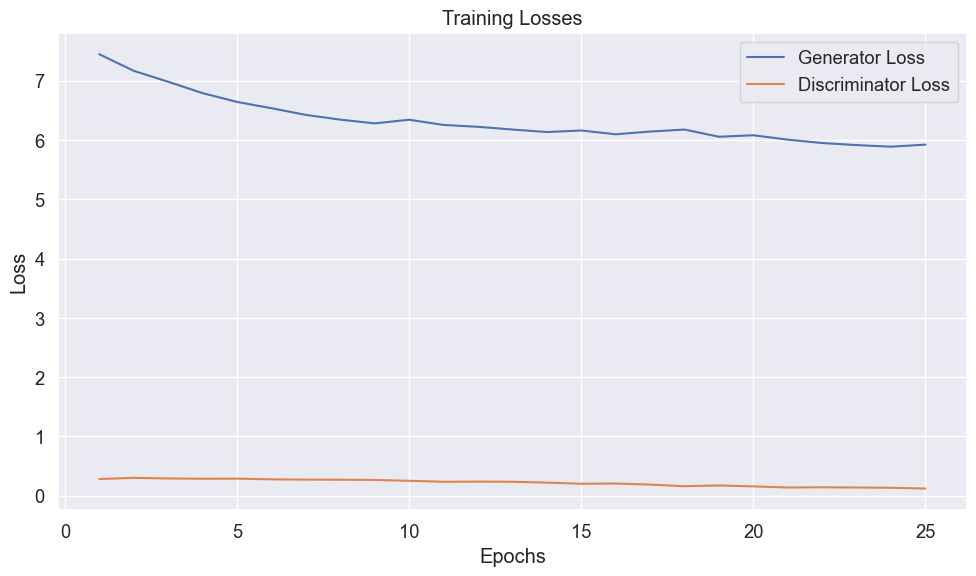

In [38]:
def plot_losses(metrics):
    epochs = range(1, len(metrics['loss_G']) + 1)

    plt.figure(figsize=(10, 6))

    plt.plot(epochs, metrics['loss_G'], label='Generator Loss')
    plt.plot(epochs, metrics['loss_D'], label='Discriminator Loss')
    plt.title('Training Losses')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.tight_layout()
    plt.show()

plot_losses(metrics_cyclegan)

In [39]:
generated_img = cv2.imread(f'./generated/generated-images-cycleganAB.png')
generated_img = generated_img[:, :, [2, 1, 0]]
generated_img_m = cv2.imread(f'./generated/generated-images-cycleganBA.png')
generated_img_m = generated_img[:, :, [2, 1, 0]]

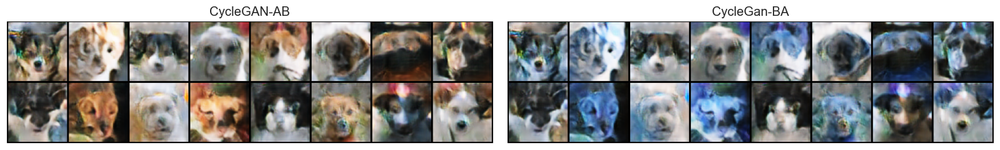

In [40]:
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

axes[0].imshow(generated_img)
axes[0].set_xticks([]); axes[0].set_yticks([])
axes[0].set_title("CycleGAN-AB")

axes[1].imshow(generated_img_m)
axes[1].set_xticks([]); axes[1].set_yticks([])
axes[1].set_title("CycleGan-BA")

plt.tight_layout()
plt.show()

#WGAN

In [27]:
import torch
import numpy as np
from torch.autograd import Variable
from tqdm import tqdm
from torchvision.utils import save_image
import torch.nn as nn

opt = {
    "n_epochs": 25,
    "batch_size": 128,
    "lr": 0.00005,
    "n_cpu": 8,
    "latent_dim": 128,
    "img_size": 64,
    "channels": 3,
    "n_critic": 2,
    "clip_value": 0.01,
    "sample_interval": 400
}

print(opt)

img_shape = (opt["channels"], opt["img_size"], opt["img_size"])
cuda = True if torch.cuda.is_available() else False


{'n_epochs': 25, 'batch_size': 128, 'lr': 5e-05, 'n_cpu': 8, 'latent_dim': 128, 'img_size': 64, 'channels': 3, 'n_critic': 2, 'clip_value': 0.01, 'sample_interval': 400}


In [28]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        def block(in_feat, out_feat, normalize=True):
            layers = [nn.Linear(in_feat, out_feat)]
            if normalize:
                layers.append(nn.BatchNorm1d(out_feat, 0.8))
            layers.append(nn.LeakyReLU(0.2, inplace=True))
            return layers

        self.model = nn.Sequential(
            *block(opt["latent_dim"], 128, normalize=False),
            *block(128, 256),
            *block(256, 512),
            *block(512, 1024),
            nn.Linear(1024, int(np.prod(img_shape))),
            nn.Tanh()
        )

    def forward(self, z):
        img = self.model(z)
        img = img.view(img.shape[0], *img_shape)
        return img

In [29]:

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()

        self.model = nn.Sequential(
            nn.Linear(int(np.prod(img_shape)), 512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(256, 1),
        )

    def forward(self, img):
        img_flat = img.view(img.shape[0], -1)
        validity = self.model(img_flat)
        return validity

In [30]:
generator = Generator()
discriminator = Discriminator()

if cuda:
    generator.cuda()
    discriminator.cuda()

optimizer_G = torch.optim.RMSprop(generator.parameters(), lr=opt["lr"])
optimizer_D = torch.optim.RMSprop(discriminator.parameters(), lr=opt["lr"])

Tensor = torch.cuda.FloatTensor if cuda else torch.FloatTensor

dataloader = train_dl

losses_G = []
losses_D = []

batches_done = 0
for epoch in range(opt["n_epochs"]):
    epoch_g_loss = 0.0
    epoch_d_loss = 0.0
    for i, (imgs, _) in tqdm(enumerate(dataloader)):

        real_imgs = Variable(imgs.type(Tensor))

        optimizer_D.zero_grad()

        z = Variable(Tensor(np.random.normal(0, 1, (imgs.shape[0], opt["latent_dim"]))))
        fake_imgs = generator(z).detach()
        loss_D = -torch.mean(discriminator(real_imgs)) + torch.mean(discriminator(fake_imgs))

        loss_D.backward()
        optimizer_D.step()

        for p in discriminator.parameters():
            p.data.clamp_(-opt["clip_value"], opt["clip_value"])

        if i % opt["n_critic"] == 0:

            optimizer_G.zero_grad()
            gen_imgs = generator(z)
            loss_G = -torch.mean(discriminator(gen_imgs))

            loss_G.backward()
            optimizer_G.step()

        epoch_g_loss += loss_G.item()
        epoch_d_loss += loss_D.item()

        if batches_done % opt["sample_interval"] == 0:
            save_image(gen_imgs.data[:25], "generated/wgan%d.png" % batches_done, nrow=5, normalize=True)
        batches_done += 1

    avg_g_loss = epoch_g_loss / len(dataloader)
    avg_d_loss = epoch_d_loss / len(dataloader)

    losses_G.append(avg_g_loss)
    losses_D.append(avg_d_loss)
    print(
        "[Epoch %d/%d] [D loss: %f] [G loss: %f]"
        % (epoch, opt["n_epochs"],  avg_d_loss, avg_g_loss)
    )

50it [00:07,  6.27it/s]


[Epoch 0/25] [D loss: -4.287865] [G loss: -7.701242]


50it [00:05,  9.75it/s]


[Epoch 1/25] [D loss: -4.513891] [G loss: -6.926497]


50it [00:07,  7.13it/s]


[Epoch 2/25] [D loss: -13.194343] [G loss: 5.380910]


50it [00:06,  7.49it/s]


[Epoch 3/25] [D loss: -4.797068] [G loss: 4.624507]


50it [00:05,  8.51it/s]


[Epoch 4/25] [D loss: 3.420124] [G loss: 3.797683]


50it [00:05,  9.23it/s]


[Epoch 5/25] [D loss: -5.074174] [G loss: 21.220063]


50it [00:05,  8.56it/s]


[Epoch 6/25] [D loss: -3.032431] [G loss: 19.882633]


50it [00:06,  8.26it/s]


[Epoch 7/25] [D loss: -2.495402] [G loss: 3.969549]


50it [00:05,  8.48it/s]


[Epoch 8/25] [D loss: -4.642880] [G loss: -6.498998]


50it [00:05,  8.72it/s]


[Epoch 9/25] [D loss: -9.920323] [G loss: -7.003006]


50it [00:07,  6.56it/s]


[Epoch 10/25] [D loss: -7.990511] [G loss: -9.703401]


50it [00:06,  7.18it/s]


[Epoch 11/25] [D loss: -9.355222] [G loss: -9.029223]


50it [00:07,  6.88it/s]


[Epoch 12/25] [D loss: -9.556491] [G loss: 5.115374]


50it [00:07,  6.68it/s]


[Epoch 13/25] [D loss: -10.125713] [G loss: 10.106701]


50it [00:05,  8.56it/s]


[Epoch 14/25] [D loss: -12.354075] [G loss: 0.769485]


50it [00:05,  8.55it/s]


[Epoch 15/25] [D loss: -13.633657] [G loss: -2.053716]


50it [00:05,  9.84it/s]


[Epoch 16/25] [D loss: -10.840825] [G loss: -1.353960]


50it [00:04, 10.13it/s]


[Epoch 17/25] [D loss: -11.351927] [G loss: 0.384472]


50it [00:05,  8.37it/s]


[Epoch 18/25] [D loss: -10.408354] [G loss: -9.260859]


50it [00:05,  9.06it/s]


[Epoch 19/25] [D loss: -4.815360] [G loss: -4.814634]


50it [00:04, 10.17it/s]


[Epoch 20/25] [D loss: -7.811539] [G loss: 5.489662]


50it [00:05,  9.75it/s]


[Epoch 21/25] [D loss: -8.862467] [G loss: -6.486506]


50it [00:06,  7.33it/s]


[Epoch 22/25] [D loss: -8.456647] [G loss: -7.830205]


50it [00:05,  8.82it/s]


[Epoch 23/25] [D loss: -6.264691] [G loss: -10.846188]


50it [00:05,  8.46it/s]

[Epoch 24/25] [D loss: -4.224403] [G loss: -9.268246]


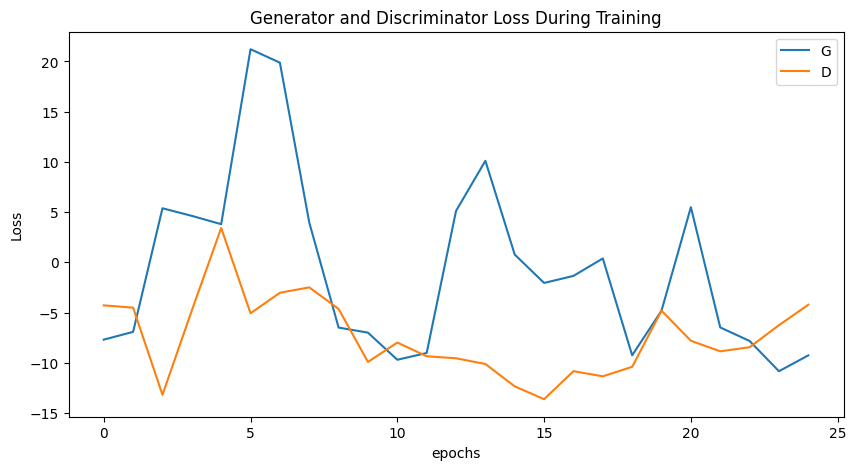

In [31]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(losses_G, label="G")
plt.plot(losses_D, label="D")
plt.xlabel("epochs")
plt.ylabel("Loss")
plt.legend()
plt.show()

In [32]:
generated_img = cv2.imread(f'./generated/wgan1200.png')
generated_img = generated_img[:, :, [2, 1, 0]]

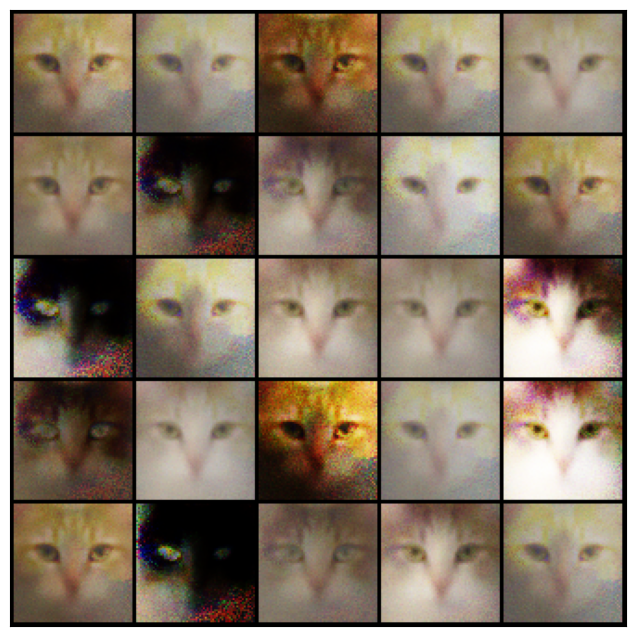

In [33]:
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_xticks([]); ax.set_yticks([])
ax.imshow(generated_img)

# Zadanie 5

In [50]:
from numpy import cov
from numpy import trace
from numpy import iscomplexobj
from numpy.random import random
from scipy.linalg import sqrtm
from torchvision.models import inception_v3

def calculate_fid(act1, act2):
    act1 = act1.cpu()
    act2 = act2.cpu()
    mu1, sigma1 = act1.mean(axis=0), cov(act1, rowvar=False)
    mu2, sigma2 = act2.mean(axis=0), cov(act2, rowvar=False)
    ssdiff = np.sum((mu1 - mu2)**2.0)

    covmean = sqrtm(sigma1.dot(sigma2))

    if iscomplexobj(covmean):
        covmean = covmean.real

    fid = ssdiff + trace(sigma1 + sigma2 - 2.0 * covmean)
    return fid

def compute_fid(model, real_loader, fake_loader, device):

    model.eval()

    inception_model = inception_v3(pretrained=True, transform_input=False).to(device)
    inception_model.eval()
    up = nn.Upsample(size=(299, 299), mode='bilinear').to(device)

    real_features = []
    for real_images, _ in real_loader:
        real_images = up(real_images).to(device)
        features = inception_model(real_images)
        real_features.append(features.detach().cpu().numpy())

    fake_features = []
    for fake_images, _ in fake_loader:
        fake_images = up(fake_images).to(device)
        features = inception_model(fake_images)
        fake_features.append(features.detach().cpu().numpy())

    fid_value = calculate_fid(np.concatenate(real_features, axis=0), np.concatenate(fake_features, axis=0))

    return fid_value

In [11]:
def visualize_tsne(real_images, fake_images):

    real_images_np = real_images.view(real_images.shape[0], -1).cpu().detach().numpy()
    fake_images_np = fake_images.view(fake_images.shape[0], -1).cpu().detach().numpy()

    n_samples = real_images_np.shape[0] + fake_images_np.shape[0]
    perplexity_value = min(30, n_samples - 1)

    tsne = TSNE(n_components=2, perplexity=perplexity_value)
    combined_data = np.vstack([real_images_np, fake_images_np])
    tsne_results = tsne.fit_transform(combined_data)

    import matplotlib.pyplot as plt
    plt.figure(figsize=(8, 6))

    plt.scatter(tsne_results[:len(real_images_np), 0], tsne_results[:len(real_images_np), 1], color='red', label='Real')
    plt.scatter(tsne_results[len(real_images_np):, 0], tsne_results[len(real_images_np):, 1], color='blue', label='Fake')

    plt.title("t-SNE visualization of Real and Fake images")
    plt.legend()
    plt.show()

CycleGAN evaluation

In [ ]:
from sklearn.manifold import TSNE
def tsne_visualization(model, loader_A, device, num_batches=10):
    all_real_images = []
    all_fake_images = []
    
    batch_count = 0

    for real_images, _ in loader_A:
        real_images = real_images.to(device)

        with torch.no_grad():
            fake_images = model(real_images)

        all_real_images.append(real_images.cpu())
        all_fake_images.append(fake_images.cpu())

        batch_count += 1
        if batch_count >= num_batches:
            break

    all_real_images = torch.cat(all_real_images, dim=0)
    all_fake_images = torch.cat(all_fake_images, dim=0)
    
    visualize_tsne(all_real_images, all_fake_images)

tsne_visualization(G, train_dl_A, device)

In [54]:
fid_value = compute_fid(G, train_dl_A, train_dl_B, device)
print(f'FID Value: {fid_value}')

c:\Users\Iga Miller\OneDrive\Pulpit\Studia_mgr_SI\Semestr2\Sieci_neuronowe\lista-1-9-15-11-00-Iga-Miller\.venv\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\Iga Miller\OneDrive\Pulpit\Studia_mgr_SI\Semestr2\Sieci_neuronowe\lista-1-9-15-11-00-Iga-Miller\.venv\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


FID Value: 1006.8018788405777


WGAN evaluation

In [52]:
from sklearn.manifold import TSNE

def tsne(generator, real_data_loader, num_batches=2):
    generator = generator.eval()

    all_real_images = []
    all_fake_images = []

    for real_images, _ in islice(real_data_loader, num_batches):

        real_images = real_images.to(device)
        all_real_images.append(real_images)

        latent = Variable(Tensor(np.random.normal(0, 1, (imgs.shape[0], opt['latent_dim']))))
        fake_images = generator(latent)
        all_fake_images.append(fake_images)

    all_real_images = torch.cat(all_real_images, 0)
    all_fake_images = torch.cat(all_fake_images, 0)

    visualize_tsne(all_real_images, all_fake_images)
    


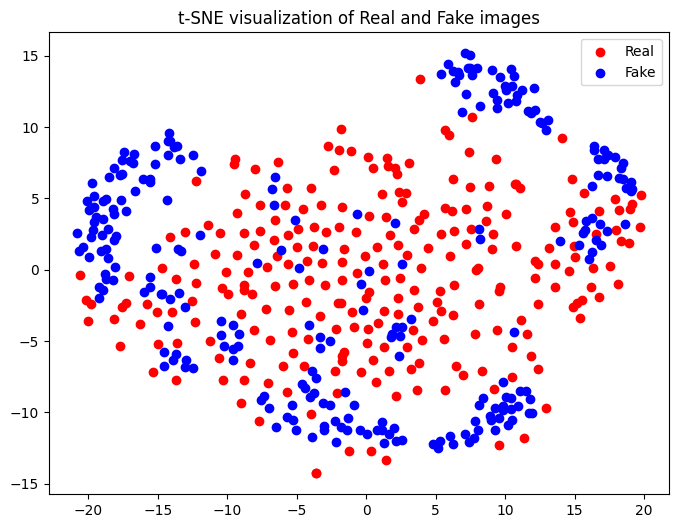

In [53]:
tsne(generator, train_dl)

In [67]:
def calculate_fid(images1, images2):
    mu1, sigma1 = images1.mean(axis=0), np.cov(images1, rowvar=False)
    mu2, sigma2 = images2.mean(axis=0), np.cov(images2, rowvar=False)
    ssdiff = np.sum((mu1 - mu2)**2.0)
    covmean = sqrtm(sigma1.dot(sigma2))
    if np.iscomplexobj(covmean):
        covmean = covmean.real
    fid = ssdiff + np.trace(sigma1 + sigma2 - 2.0 * covmean)
    return fid


In [65]:
import torchvision.transforms.functional as TF

def resize_batch(batch, size):
    resized_batch = torch.zeros((batch.size(0), batch.size(1), size, size)).to(batch.device)
    for i in range(batch.size(0)):
        resized_batch[i] = TF.resize(batch[i], size=size)
    return resized_batch

size_required_for_inception = 299

real_images = next(iter(dataloader))[0]
real_images = resize_batch(real_images, size_required_for_inception).to("cuda" if cuda else "cpu")

with torch.no_grad():
    z = torch.randn(real_images.shape[0], opt["latent_dim"], device="cuda" if cuda else "cpu")
    fake_images = generator(z)
    fake_images = resize_batch(fake_images, size_required_for_inception).to("cuda" if cuda else "cpu")


In [68]:
inception_model = inception_v3(pretrained=True, transform_input=False).eval().to("cuda" if cuda else "cpu")

with torch.no_grad():
    real_features = inception_model(real_images).cpu().numpy()
    fake_features = inception_model(fake_images).cpu().numpy()

fid_score = calculate_fid(real_features, fake_features)
print("FID Score:", fid_score)


FID Score: 1145.8547780066958
